## COGS 199 - Special Project

# 1. Introduction

### Overview:

#### 1. Introduction
-	Project overview and description

#### 2.	Setup
- Marked out: Function for saving figures

- Import packages
- Install CLIP
- Load files
- Install PyTorch with MPS Support (for my Mac M2)
- Verify use of MPS 
  
#### 3.	Data Preparation
-	Load and inspect NSD-stimuli files.
-	Marked out: Divide into three subsets: small (n = 100 images), medium (n = 10.000 images), large (n = 20.000 images)
-	PCA and K-means on medium subset without CLIP (with example images from the clusters)

#### 4.	Feature Extraction with CLIP
-	Marked out: Use CLIP on the three subsets and extract embeddings.
-	Apply function for scaling/normalize/standardize
  
#### 5.	Exploration and clustering
1.
-	Visualize and compare t-SNE and UMAP on unscaled vs. scaled CLIP embeddings.

2.
-	Apply K-means on embeddings -- without PCA (k = 3, 5, 10, 15, 25, 35, 50)
-	Visualize K-means clustering (k = 10)

3.
-	Apply K-means on PCA-reduced CLIP embeddings (50 components)
-	Visualize K-means clustering with PCA (50 components)
  
4.
-	Apply K-means on PCA-reduced CLIP embeddings (to retain 95% variance)
-	Visualize K-means clustering with PCA (95% variance)
  
#### 6.	Optimization:
-	t-SNE and UMAP on the reduced components (PCA) of the CLIP embeddings
-	K-means with silhouette scores on the t-SNE projection of the reduced components (PCA) of the CLIP embeddings
  
#### 7.	Evaluation:
-	Silhouette Scores and Inertia (Elbow Method) for the CLIP embeddings with PCA

## Project Description

The main objective of this project was to apply k-means clustering and Principal Component Analysis (PCA) to the CLIP latent space of visual images. This exploration was aimed at deepening my understanding of unsupervised machine learning methods, and evaluating the advantages and limitations, as well as to gain insights into the deployment of CLIP for feature extraction and the approach of mapping high-dimensional visual features into meaningful representations.

Inspired by the work of Takagi and Nishimoto (2023), the Natural Scenes Dataset (NSD) was selected for analysis due to its diversity of natural image stimuli, including objects, locations, faces, and more. A challenge arising from the dataset's rich diversity is that its underlying structure may not be easily or linearly separable. However, the NSD’s relevance extends beyond just the stimuli images, as it includes 7T fMRI data from eight participants viewing this stimulus. (Allen et al., 2022).

For the project, the foundation was based on class material and resources provided in COGS 118B, complemented by “Machine Learning with PyTorch and Scikit-Learn: Develop Machine Learning and Deep Learning Models with Python” by Raschka et al. (2022). Additionally, I used large language models (LLMs) for assistance with repetitive code, debugging, and for help with implementing advanced visualization techniques like t-SNE and UMAP, and to evaluate clustering performance using silhouette scores and inertia (via the elbow method).

This project was both engaging and a rich learning experience but did also prove to be challenging in terms of applying a centroid-based clustering algorithm, like k-means to a large and highly varied dataset like NSD, as well as a large number of initial preprocessing steps.

# 2. Setup:

- Import packages
- Install CLIP
- Load files
- Install PyTorch with MPS Support (for my Mac M2)
- Verify use of MPS 

### Function for saving figures
- marked out

save_current_figure_sequentially()

figure_counter = 1

def save_current_figure_sequentially(folder_path=None, file_format="jpg"):
    """
    Save the current Matplotlib figure to a specified folder with a unique sequential name.

    Args:
        folder_path (str): Path to the folder where the figure will be saved.
                           Default: "visualization_COGS199" on the desktop.
        file_format (str): File format to save the figure (e.g., "jpg", "png").
    """
    global figure_counter

    if folder_path is None:
        folder_path = os.path.join(os.path.expanduser("~"), "Desktop", "visualization_COGS199")

    os.makedirs(folder_path, exist_ok=True)

    file_name = f"fig_{figure_counter}.{file_format}"
    file_path = os.path.join(folder_path, file_name)

    plt.savefig(file_path, format=file_format, dpi=300)
    print(f"Figure saved as: {file_path}")

    figure_counter += 1

In [1]:
# Import packages

!pip install notebook
!pip install umap-learn
!pip install h5py tqdm

import umap.umap_ as umap

import h5py

import random
import os

import matplotlib.pyplot as plt
import numpy as np


from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_distances

from PIL import Image
from collections import Counter

In [2]:
# Install CLIP

!pip install openai-clip torch torchvision

import clip

In [3]:
# Load embedding-files

paths = {
    "small": {
        "unscaled": "clip_embeddings_small.npy",
        "scaled": "clip_embeddings_small_scaled.npy"
    },
    "medium": {
        "unscaled": "clip_embeddings_medium.npy",
        "scaled": "clip_embeddings_medium_scaled.npy"
    },
    "large": {
        "unscaled": "clip_embeddings_large.npy",
        "scaled": "clip_embeddings_large_scaled.npy"
    }
}

def load_embeddings(paths):
    embeddings = {}
    for dataset_size, paths_dict in paths.items():
        embeddings[dataset_size] = {}
        for scale_type, path in paths_dict.items():
            embeddings[dataset_size][scale_type] = np.load(path)
            print(f"Loaded {scale_type} embeddings for {dataset_size} dataset: "
                  f"Shape {embeddings[dataset_size][scale_type].shape}, "
                  f"Data type: {embeddings[dataset_size][scale_type].dtype}")
    return embeddings
    
embeddings = load_embeddings(paths)

Loaded unscaled embeddings for small dataset: Shape (100, 512), Data type: float16
Loaded scaled embeddings for small dataset: Shape (100, 512), Data type: float16
Loaded unscaled embeddings for medium dataset: Shape (10000, 512), Data type: float16
Loaded scaled embeddings for medium dataset: Shape (10000, 512), Data type: float16
Loaded unscaled embeddings for large dataset: Shape (20000, 512), Data type: float16
Loaded scaled embeddings for large dataset: Shape (20000, 512), Data type: float16


In [4]:
# Install PyTorch with MPS Support (for my Mac M2)

!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cpu

Looking in indexes: https://download.pytorch.org/whl/cpu


In [5]:
# Verify use of MPS

import torch
print(torch.backends.mps.is_available())

True


# 3. Data Preparation:

In [7]:
# Inspect NSD-data

# Load NSD stimuli file
path_to_nsd = '/Users/henrikformoe/Desktop/Desktop_M2/COGS199/Natural_Scenes_Dataset_partial/nsd_stimuli.hdf5'

# Open the file and list keys
with h5py.File(path_to_nsd, 'r') as f:
    print(list(f.keys()))  # Explore dataset structure

['imgBrick']


In [8]:
# Data shape and type, and structure of first image

with h5py.File(path_to_nsd, 'r') as f:
    images = f['imgBrick']
    print(images.shape)
    print(images.dtype)
    print(images[0])

(73000, 425, 425, 3)
uint8
[[[162 177 172]
  [161 175 176]
  [159 169 179]
  ...
  [151 168 176]
  [144 164 171]
  [151 165 166]]

 [[154 173 171]
  [169 181 181]
  [161 175 185]
  ...
  [153 164 176]
  [143 165 174]
  [155 174 178]]

 [[161 178 168]
  [160 176 170]
  [154 172 178]
  ...
  [151 165 175]
  [150 165 179]
  [156 166 175]]

 ...

 [[191 214 222]
  [200 218 232]
  [201 216 232]
  ...
  [225 235 243]
  [215 234 249]
  [223 246 252]]

 [[188 215 224]
  [192 222 233]
  [197 226 238]
  ...
  [199 230 235]
  [212 233 238]
  [224 244 251]]

 [[191 220 228]
  [191 223 234]
  [189 221 232]
  ...
  [200 229 237]
  [212 233 238]
  [216 239 245]]]


In [9]:
# Function to inspect images

def display_random_images_from_dataset(hdf5_path, dataset_key, num_images=20, max_images=20000, image_size=(5, 5)):
    """
    Displays random images from the specified HDF5 dataset in two columns.

    Args:
        hdf5_path (str): Path to the HDF5 file.
        dataset_key (str): Key to access the dataset within the HDF5 file.
        num_images (int): Number of random images to display.
        max_images (int): Maximum index of images to sample from.
        image_size (tuple): Size of each individual image in the grid.

    Returns:
        None
    """
    with h5py.File(hdf5_path, 'r') as f:
        dataset = f[dataset_key]
        
        max_index = min(max_images, dataset.shape[0])
        image_indices = random.sample(range(max_index), num_images)
        
        images = [dataset[idx] for idx in image_indices]
        
    n_cols = 4
    n_rows = (num_images + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(image_size[0] * n_cols, image_size[1] * n_rows))
    axes = axes.flatten()
    
    for ax, img in zip(axes, images):
        ax.imshow(img)
        ax.axis('off')

    for ax in axes[len(images):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

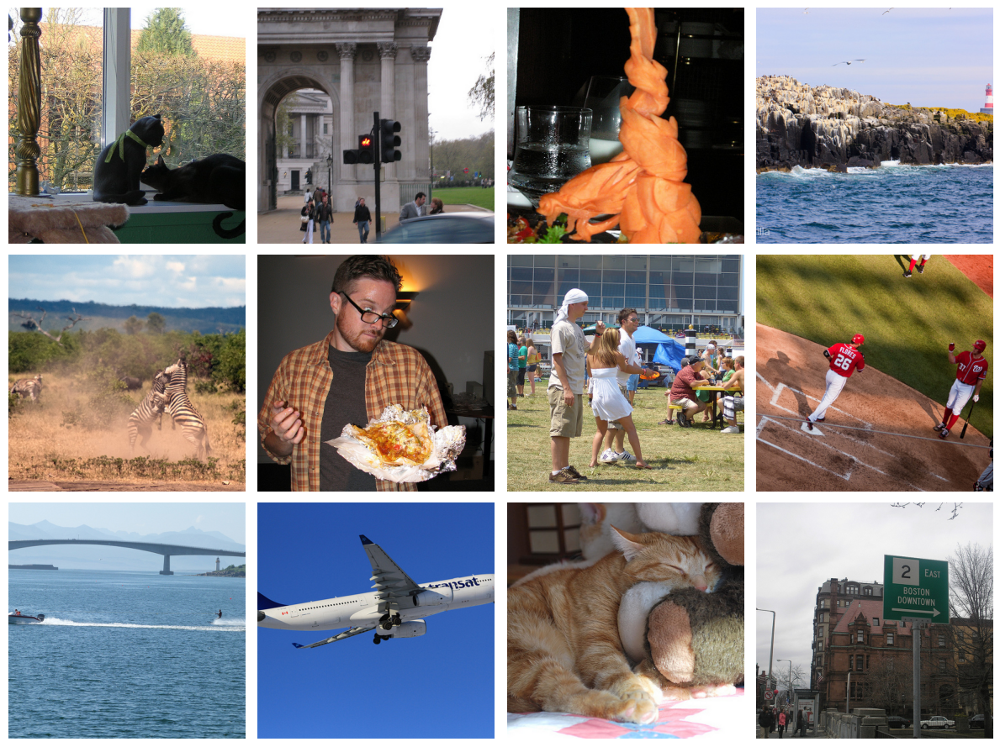

In [10]:
# Displays ten random images from NSD

path_to_nsd = '/Users/henrikformoe/Desktop/Desktop_M2/COGS199/Natural_Scenes_Dataset_partial/nsd_stimuli.hdf5'
display_random_images_from_dataset(path_to_nsd, 'imgBrick', num_images=12, max_images=20000, image_size=(3, 3))

#### Below I have marked out code that generated the subsets of the NSD-data, and also the code that extracted the CLIP embeddings (both unscaled and scaled).

### Small dataset:

subset_size = 100  # Process only the first 100 images for now

with h5py.File(path_to_nsd, 'r') as f:
    small_images = f['imgBrick'][:subset_size]  # Load the first 100 images
print(f"Loaded {subset_size} images with shape {images.shape} and dtype {images.dtype}")

### Medium dataset:

subset_size = 10000  # Process the first 10,000 images

with h5py.File(path_to_nsd, 'r') as f:
    medium_images = f['imgBrick'][:subset_size]
    print(f"Loaded {subset_size} images with shape {images.shape} and dtype {images.dtype}")

### Large dataset:

subset_size = 20000  # Process the first 20,000 images

with h5py.File(path_to_nsd, 'r') as f:
    large_images = f['imgBrick'][:subset_size]
    print(f"Loaded {subset_size} images with shape {images.shape} and dtype {images.dtype}")

### Inspect medium dataset using PCA and K-means (without CLIP):

In [73]:
def plot_cluster_examples(images, labels, n_clusters):
    for cluster_id in range(n_clusters):
        cluster_indices = [i for i, label in enumerate(labels) if label == cluster_id]
        plt.figure(figsize=(10, 5))
        for idx, image_idx in enumerate(cluster_indices[:10]):
            plt.subplot(1, 10, idx + 1)
            plt.imshow(images[image_idx])
            plt.axis('off')
        plt.suptitle(f"Cluster {cluster_id}")
        plt.show()

PCA-reduced features shape: (10000, 50)
K-Means clustering completed with 35 clusters.
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_4.jpg


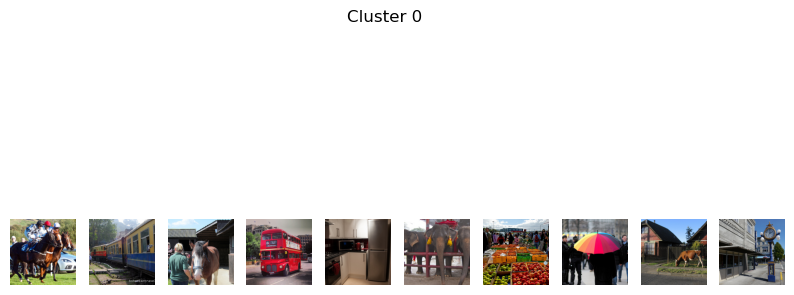

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_5.jpg


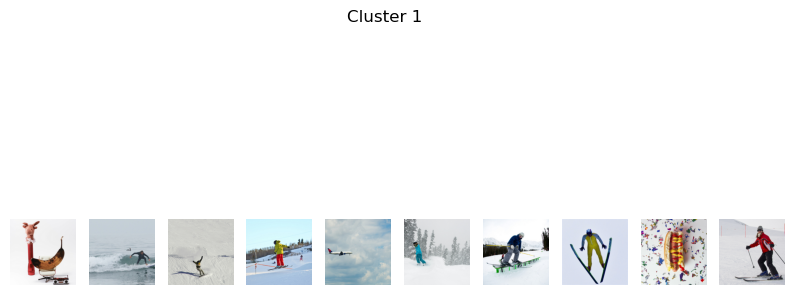

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_6.jpg


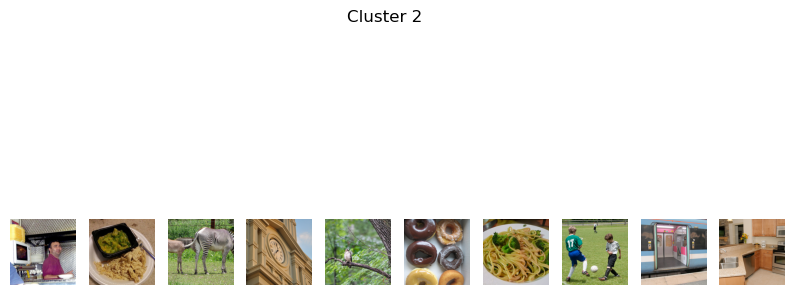

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_7.jpg


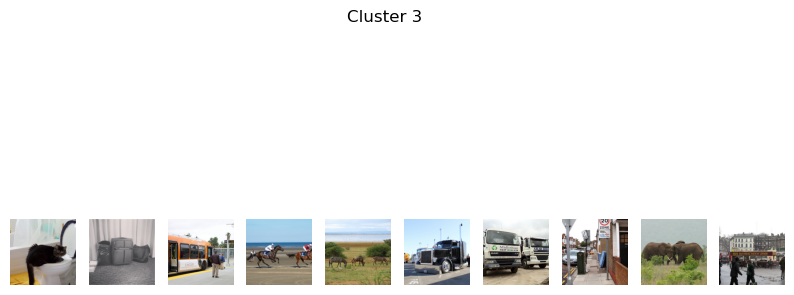

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_8.jpg


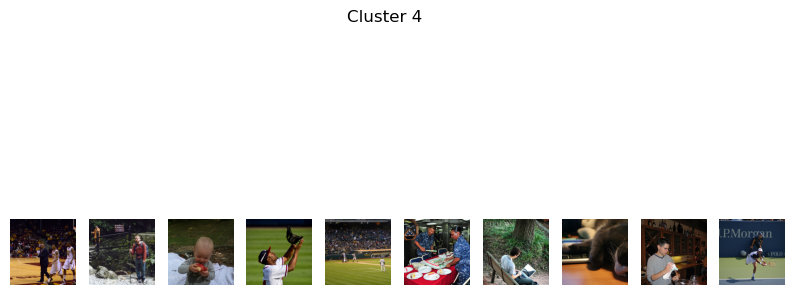

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_9.jpg


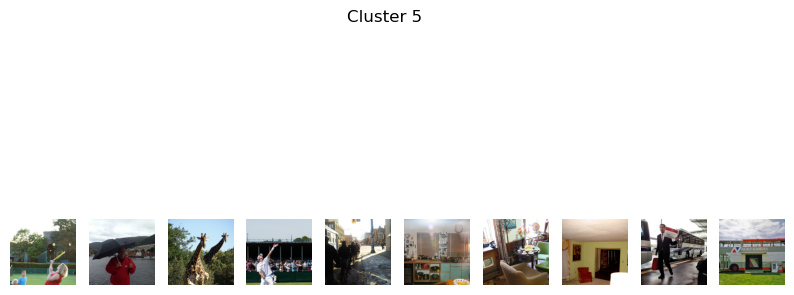

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_10.jpg


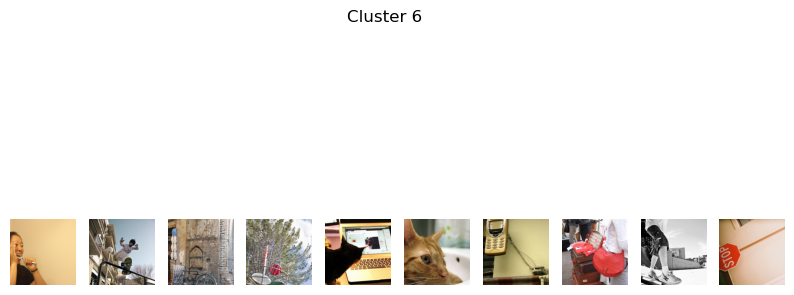

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_11.jpg


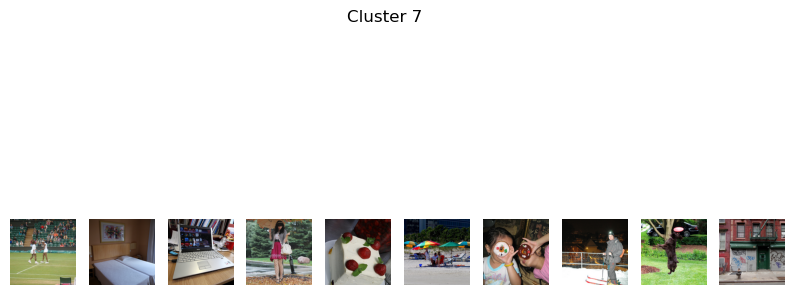

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_12.jpg


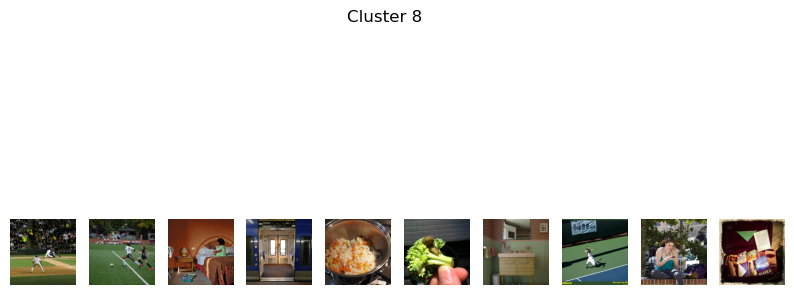

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_13.jpg


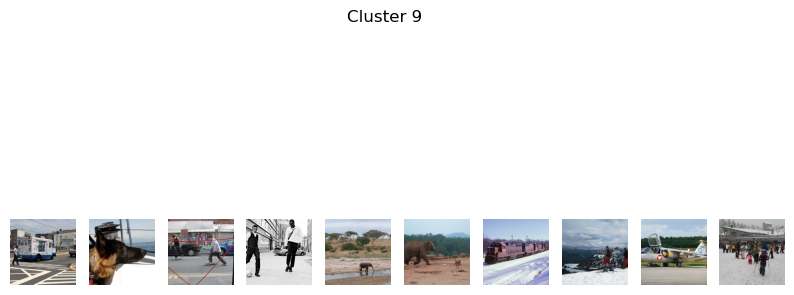

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_14.jpg


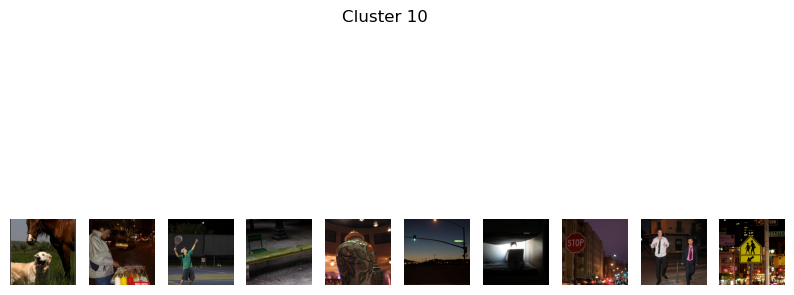

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_15.jpg


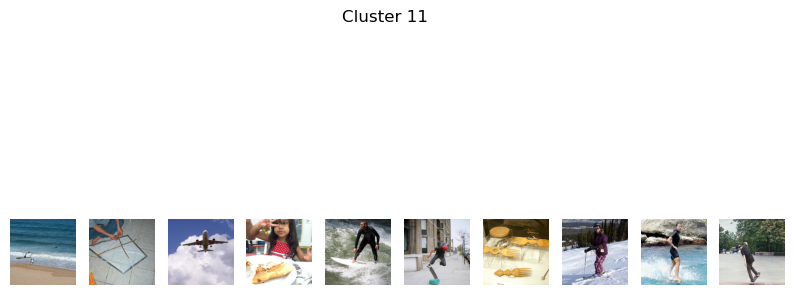

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_16.jpg


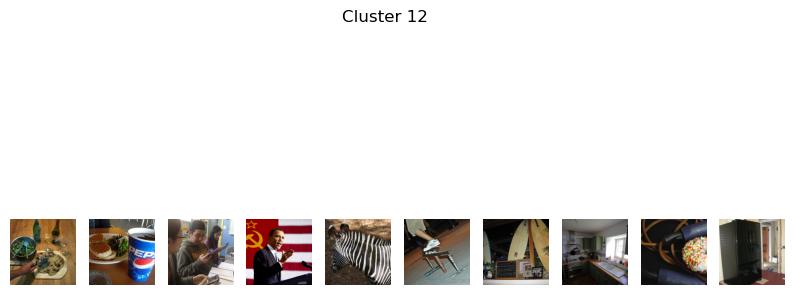

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_17.jpg


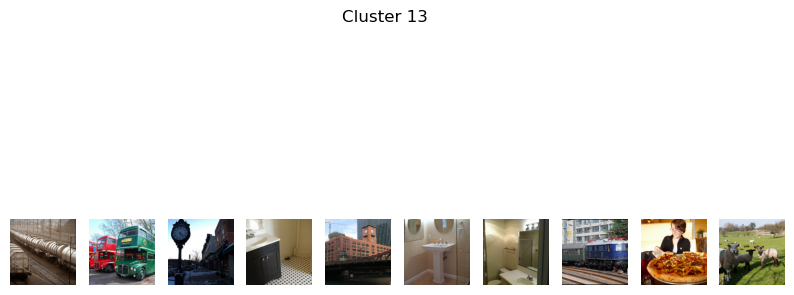

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_18.jpg


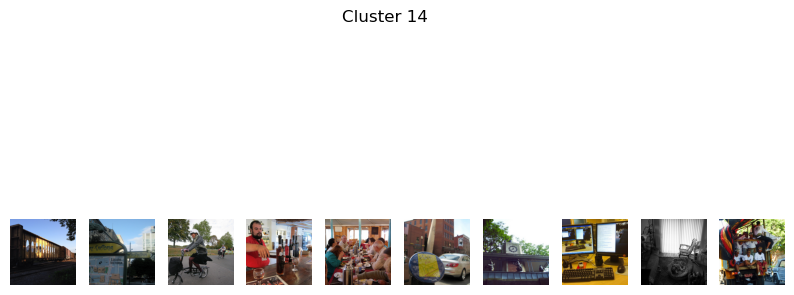

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_19.jpg


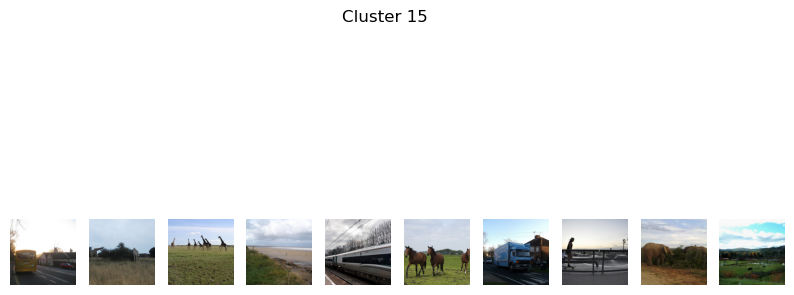

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_20.jpg


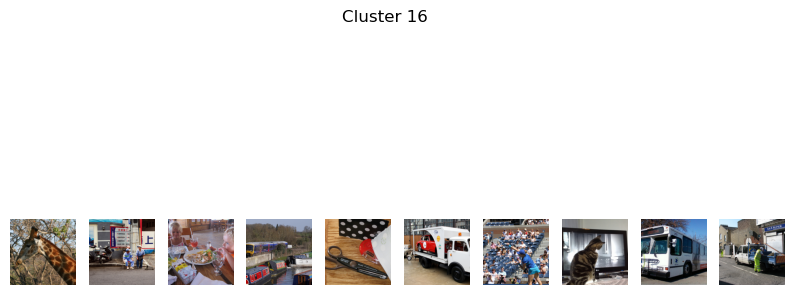

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_21.jpg


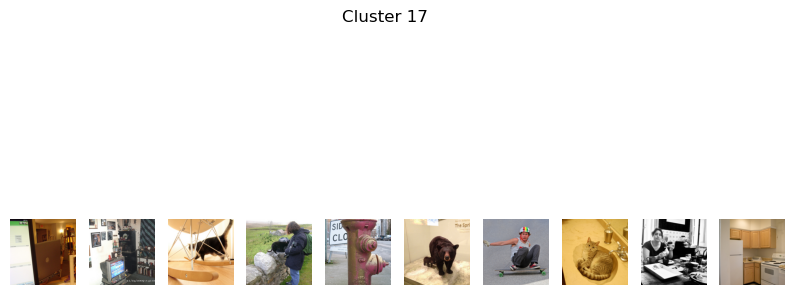

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_22.jpg


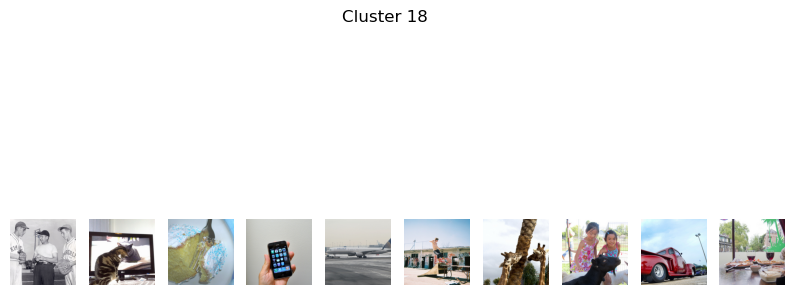

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_23.jpg


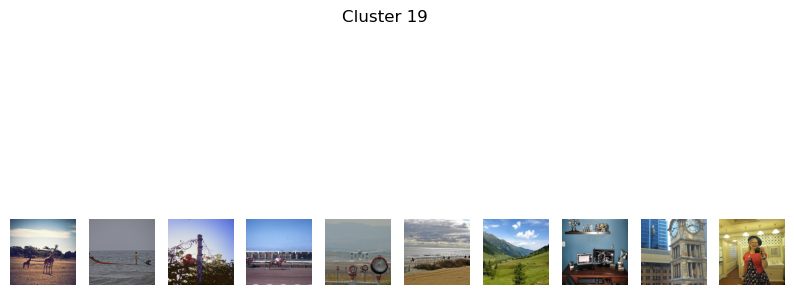

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_24.jpg


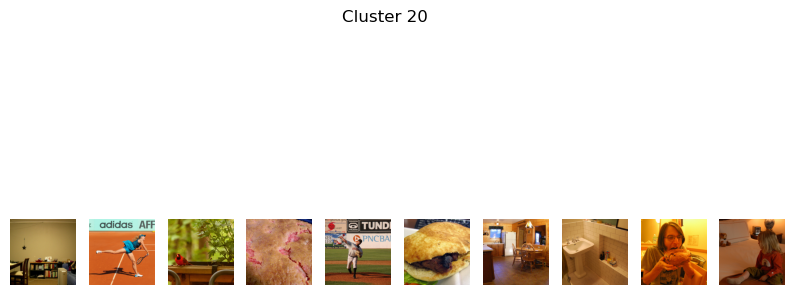

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_25.jpg


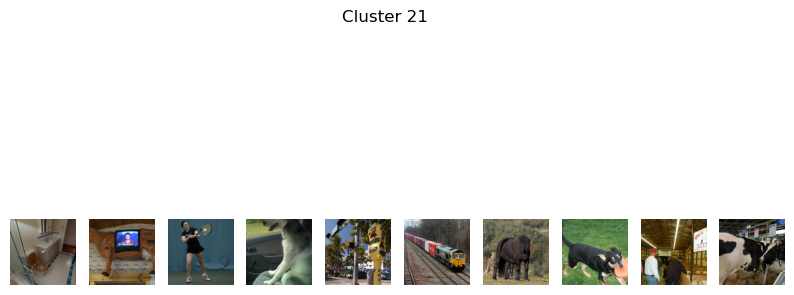

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_26.jpg


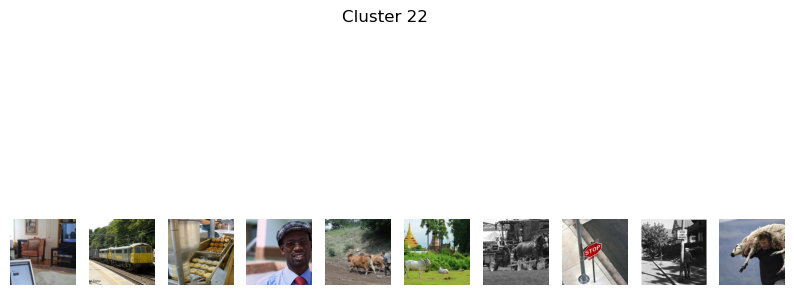

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_27.jpg


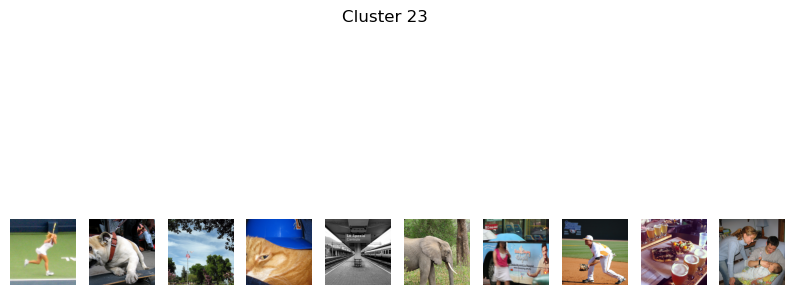

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_28.jpg


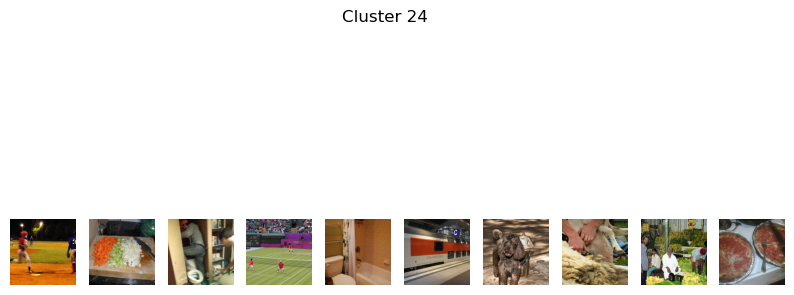

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_29.jpg


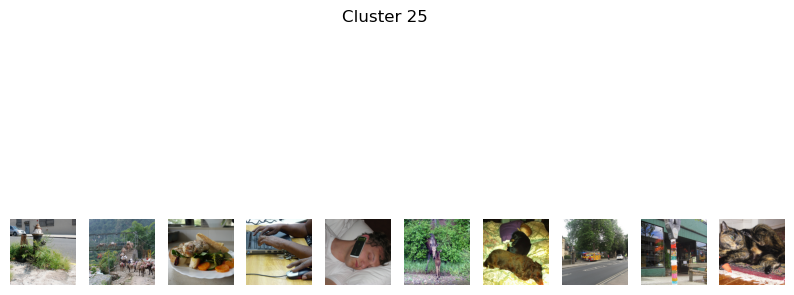

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_30.jpg


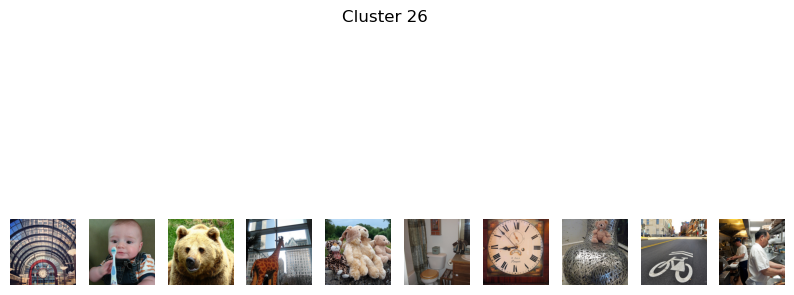

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_31.jpg


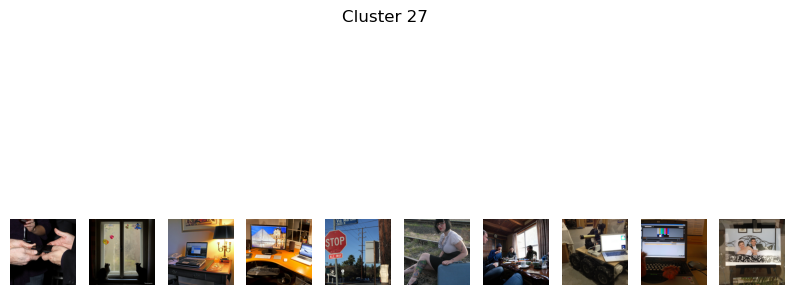

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_32.jpg


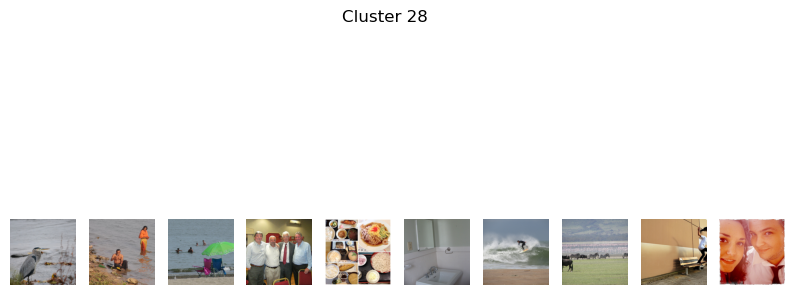

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_33.jpg


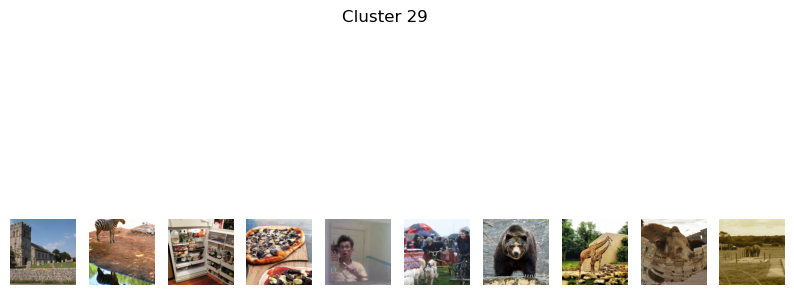

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_34.jpg


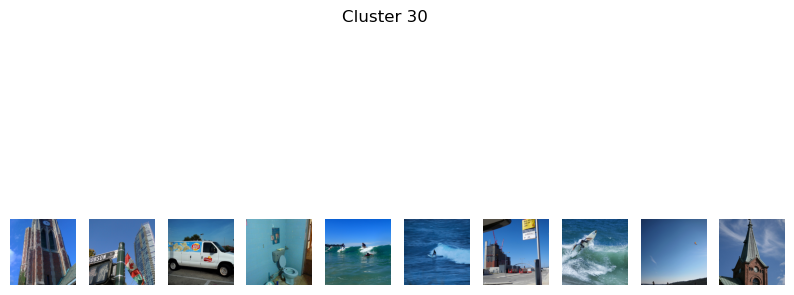

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_35.jpg


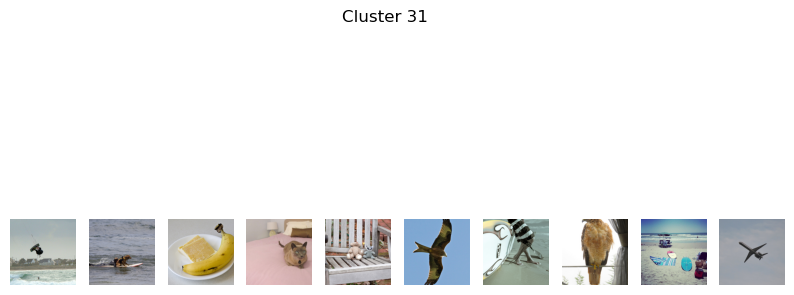

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_36.jpg


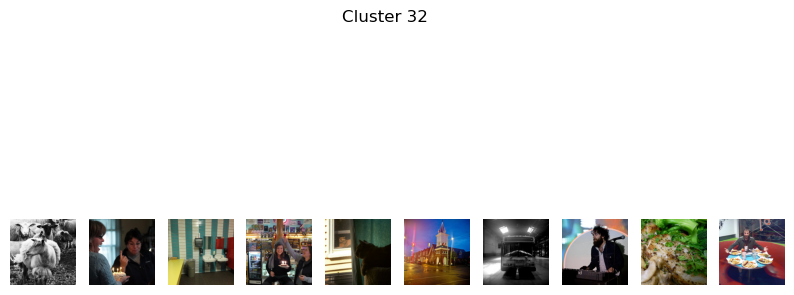

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_37.jpg


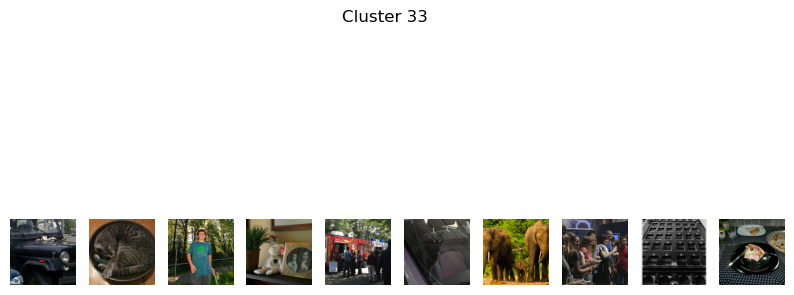

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_38.jpg


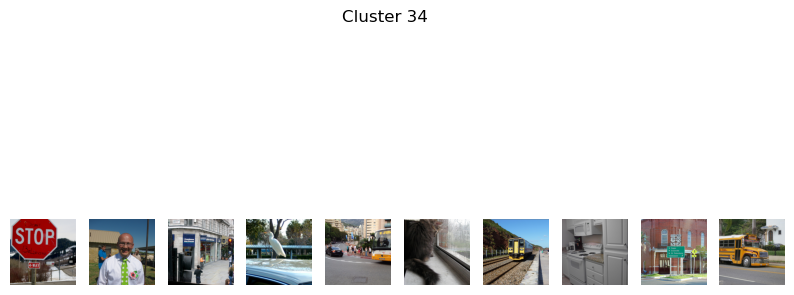

In [75]:
batch_size = 256
n_components = 50

sample_batch = medium_images[:batch_size].reshape(batch_size, -1)
pca = PCA(n_components=min(n_components, sample_batch.shape[1]))
pca.fit(sample_batch)

pca_features_all = []

for i in range(0, len(medium_images), batch_size):
    batch = medium_images[i:i + batch_size]
    flattened_batch = batch.reshape(len(batch), -1)
    batch_pca_features = pca.transform(flattened_batch)
    pca_features_all.append(batch_pca_features)

pca_features = np.vstack(pca_features_all)
print(f"PCA-reduced features shape: {pca_features.shape}")

n_clusters = 35

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(pca_features)
print(f"K-Means clustering completed with {n_clusters} clusters.")

plot_cluster_examples(medium_images, cluster_labels, n_clusters=n_clusters)

# 4. Feature Extraction with CLIP:

The CLIP model was applied to three datasets (small, medium and large).

For each dataset:

- Images were preprocessed into tensors using the CLIP preprocessing pipeline.
- Tensors were passed through the CLIP model to generate embeddings.
- These embeddings were saved as .npy files for further use.

In [109]:
# Load CLIP model
device = 'mps' if torch.backends.mps.is_available() else 'cpu'
model, preprocess = clip.load("ViT-B/32", device=device)

In [110]:
def extract_embeddings_batched(images, output_file_base, device, batch_size=256):
    """
    Process images in batches and extract embeddings using CLIP.

    Args:
        images (numpy array): Array of images to process.
        output_file_base (str): Base path (without extension) to save the embeddings.
        device (str): Device to use ('cpu' or 'mps').
        batch_size (int): Number of images to process in a batch.
    """
    all_embeddings = []

    for i in range(0, len(images), batch_size):
        batch = images[i:i + batch_size]
        
        preprocessed_batch = [preprocess(Image.fromarray(img)) for img in batch]
        image_tensors = torch.stack(preprocessed_batch).to(device)
        
        with torch.no_grad():
            batch_embeddings = model.encode_image(image_tensors)
            all_embeddings.append(batch_embeddings.cpu().numpy())
        
        print(f"Processed batch {i // batch_size + 1}/{(len(images) + batch_size - 1) // batch_size}")

    all_embeddings = np.vstack(all_embeddings)

    if output_file_base.endswith('.npy') or output_file_base.endswith('.pt'):
        output_file_base = output_file_base.rsplit('.', 1)[0]

    np.save(f"{output_file_base}.npy", all_embeddings)
    print(f"Embeddings saved to {output_file_base}.npy")

    torch.save(torch.tensor(all_embeddings), f"{output_file_base}.pt")
    print(f"Embeddings saved to {output_file_base}.pt")

In [144]:
# function for scaling the embedding files

def scale_embeddings(embeddings, output_path):
    """
    Scale embeddings using StandardScaler and save the scaled version.

    Args:
        embeddings (numpy array): The embeddings to be scaled.
        output_path (str): Path to save the scaled embeddings (NumPy file).

    Returns:
        numpy array: Scaled embeddings.
    """
    scaler = StandardScaler()
    print(f"Scaling embeddings and saving to {output_path}...")
    scaled_embeddings = scaler.fit_transform(embeddings)
    np.save(output_path, scaled_embeddings)
    print(f"Scaled embeddings saved to {output_path}.")
    return scaled_embeddings    

### Small dataset:

# Small dataset
subset_size = 100  # Dataset size
batch_size = 256  # Smaller batch

with h5py.File(path_to_nsd, 'r') as f:
    small_images = f['imgBrick'][:subset_size]

# Run the function with batch processing
extract_embeddings_batched(small_images, 'clip_embeddings_small.npy', device, batch_size=batch_size)

small_embeddings_scaled = scale_embeddings(small_embeddings, "clip_embeddings_small_scaled.npy")

print(f"First 5 embeddings from small dataset:\n{small_embeddings_npy[:5]}")
print(f"First 5 embeddings from small dataset (scaled):\n{small_embeddings_scaled[:5]}")

### Medium dataset:

# Medium dataset
subset_size = 10000  # Dataset size
batch_size = 256  # Smaller batches to avoid memory issues

with h5py.File(path_to_nsd, 'r') as f:
    medium_images = f['imgBrick'][:subset_size]

# Run the function with batch processing
extract_embeddings_batched(medium_images, 'clip_embeddings_medium.npy', device, batch_size=batch_size)

medium_embeddings_scaled = scale_embeddings(medium_embeddings, "clip_embeddings_medium_scaled.npy")

print(f"First 5 embeddings from medium dataset:\n{medium_embeddings_npy[:5]}")
print(f"First 5 embeddings from medium dataset (scaled):\n{medium_embeddings_scaled[:5]}")

### Large dataset:

# Large dataset
subset_size = 20000  # Dataset size
batch_size = 256  # Smaller batches to avoid memory issues

with h5py.File(path_to_nsd, 'r') as f:
    large_images = f['imgBrick'][:subset_size]
large_embeddings_scaled = scale_embeddings(large_embeddings, "clip_embeddings_large_scaled.npy")
# Run the function with batch processing
extract_embeddings_batched(large_images, 'clip_embeddings_large.npy', device, batch_size=batch_size)

large_embeddings_scaled = scale_embeddings(large_embeddings, "clip_embeddings_large_scaled.npy")

print(f"First 5 embeddings from large dataset:\n{large_embeddings_npy[:5]}")
print(f"First 5 embeddings from large dataset (scaled):\n{large_embeddings_scaled[:5]}")

### Check embedding files:

In [212]:
# Paths to saved embeddings
small_embeddings_npy_path = 'clip_embeddings_small.npy'
medium_embeddings_npy_path = 'clip_embeddings_medium.npy'
large_embeddings_npy_path = 'clip_embeddings_large.npy'

small_embeddings_scaled_npy_path = 'clip_embeddings_small_scaled.npy'
medium_embeddings_scaled_npy_path = 'clip_embeddings_medium_scaled.npy'
large_embeddings_scaled_npy_path = 'clip_embeddings_large_scaled.npy'

# Load and verify .npy embeddings
small_embeddings_npy = np.load(small_embeddings_npy_path)
medium_embeddings_npy = np.load(medium_embeddings_npy_path)
large_embeddings_npy = np.load(large_embeddings_npy_path)

small_embeddings_scaled_npy = np.load(small_embeddings_scaled_npy_path)
medium_embeddings_scaled_npy = np.load(medium_embeddings_scaled_npy_path)
large_embeddings_scaled_npy = np.load(large_embeddings_scaled_npy_path)

print("Checking .npy files:")
print(f"Shape of small embeddings (.npy): {small_embeddings_npy.shape}")
print(f"Shape of medium embeddings (.npy): {medium_embeddings_npy.shape}")
print(f"Shape of large embeddings (.npy): {large_embeddings_npy.shape}")
print(f"Data type of small embeddings (.npy): {small_embeddings_npy.dtype}")
print(f"Data type of medium embeddings (.npy): {medium_embeddings_npy.dtype}")
print(f"Data type of large embeddings (.npy): {large_embeddings_npy.dtype}\n")

print("Checking scaled .npy files:")
print(f"Shape of small scaled embeddings (.npy): {small_embeddings_scaled_npy.shape}")
print(f"Shape of medium scaled embeddings (.npy): {medium_embeddings_scaled_npy.shape}")
print(f"Shape of large scaled embeddings (.npy): {large_embeddings_scaled_npy.shape}")
print(f"Data type of small scaled embeddings (.npy): {small_embeddings_scaled_npy.dtype}")
print(f"Data type of medium scaled embeddings (.npy): {medium_embeddings_scaled_npy.dtype}")
print(f"Data type of large scaled embeddings (.npy): {large_embeddings_scaled_npy.dtype}\n")

# Load and verify .pt embeddings
small_embeddings_pt_path = 'clip_embeddings_small.pt'
medium_embeddings_pt_path = 'clip_embeddings_medium.pt'
large_embeddings_pt_path = 'clip_embeddings_large.pt'

small_embeddings_pt = torch.load(small_embeddings_pt_path)
medium_embeddings_pt = torch.load(medium_embeddings_pt_path)
large_embeddings_pt = torch.load(large_embeddings_pt_path)

print("Checking .pt files:")
print(f"Shape of small embeddings (.pt): {small_embeddings_pt.shape}")
print(f"Shape of medium embeddings (.pt): {medium_embeddings_pt.shape}")
print(f"Shape of large embeddings (.pt): {large_embeddings_pt.shape}")
print(f"Data type of small embeddings (.pt): {small_embeddings_pt.dtype}")
print(f"Data type of medium embeddings (.pt): {medium_embeddings_pt.dtype}")
print(f"Data type of large embeddings (.pt): {large_embeddings_pt.dtype}\n")

Checking .npy files:
Shape of small embeddings (.npy): (100, 512)
Shape of medium embeddings (.npy): (10000, 512)
Shape of large embeddings (.npy): (20000, 512)
Data type of small embeddings (.npy): float16
Data type of medium embeddings (.npy): float16
Data type of large embeddings (.npy): float16

Checking scaled .npy files:
Shape of small scaled embeddings (.npy): (100, 512)
Shape of medium scaled embeddings (.npy): (10000, 512)
Shape of large scaled embeddings (.npy): (20000, 512)
Data type of small scaled embeddings (.npy): float16
Data type of medium scaled embeddings (.npy): float16
Data type of large scaled embeddings (.npy): float16

Checking .pt files:
Shape of small embeddings (.pt): torch.Size([100, 512])
Shape of medium embeddings (.pt): torch.Size([10000, 512])
Shape of large embeddings (.pt): torch.Size([20000, 512])
Data type of small embeddings (.pt): torch.float16
Data type of medium embeddings (.pt): torch.float16
Data type of large embeddings (.pt): torch.float16



/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/2742197771.py:40: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  small_embeddings_pt = torch.load(small_embed

# 5. Exploration and Clustering:

In [464]:
# Function to visualize embeddings using scatter plots
def visualize_embeddings(data_2d, title, labels=None):
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(data_2d[:, 0], data_2d[:, 1], c=labels, cmap='viridis', s=5, alpha=0.7)
    if labels is not None:
        plt.colorbar(scatter)
    plt.title(title)
    save_current_figure_sequentially()
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.show()

small_embeddings_npy_path = 'clip_embeddings_small.npy'
medium_embeddings_npy_path = 'clip_embeddings_medium.npy'
large_embeddings_npy_path = 'clip_embeddings_large.npy'

small_embeddings_scaled_npy_path = 'clip_embeddings_small_scaled.npy'
medium_embeddings_scaled_npy_path = 'clip_embeddings_medium_scaled.npy'
large_embeddings_scaled_npy_path = 'clip_embeddings_large_scaled.npy'

small_embeddings = np.load(small_embeddings_npy_path)
medium_embeddings = np.load(medium_embeddings_npy_path)
large_embeddings = np.load(large_embeddings_npy_path)

small_embeddings_scaled = np.load(small_embeddings_scaled_npy_path)
medium_embeddings_scaled = np.load(medium_embeddings_scaled_npy_path)
large_embeddings_scaled = np.load(large_embeddings_scaled_npy_path)

## Exploring using t-SNE and UMAP:

### Create t-SNE and UMAP for

### Small dataset:

In [469]:
print("Running t-SNE and UMAP on small embeddings...")
tsne_small = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
small_embeddings_tsne = tsne_small.fit_transform(small_embeddings)

tsne_small_scaled = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
small_embeddings_scaled_tsne = tsne_small_scaled.fit_transform(small_embeddings_scaled)

umap_small = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
small_embeddings_umap = umap_small.fit_transform(small_embeddings)

umap_small_scaled = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
small_embeddings_scaled_umap = umap_small_scaled.fit_transform(small_embeddings_scaled)

Running t-SNE and UMAP on small embeddings...


/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


### Medium dataset:

In [175]:
print("Running t-SNE and UMAP on medium embeddings...")
tsne_medium = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
medium_embeddings_tsne = tsne_medium.fit_transform(medium_embeddings)

tsne_medium_scaled = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
medium_embeddings_scaled_tsne = tsne_medium_scaled.fit_transform(medium_embeddings_scaled)

umap_medium = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
medium_embeddings_umap = umap_medium.fit_transform(medium_embeddings)

umap_medium_scaled = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
medium_embeddings_scaled_umap = umap_medium_scaled.fit_transform(medium_embeddings_scaled)

Running t-SNE and UMAP on medium embeddings...


/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


### Large dataset:

In [178]:
print("Running t-SNE and UMAP on large embeddings...")
tsne_large = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
large_embeddings_tsne = tsne_large.fit_transform(large_embeddings)

tsne_large_scaled = TSNE(n_components=2, perplexity=30, random_state=42, n_iter=1000)
large_embeddings_scaled_tsne = tsne_large_scaled.fit_transform(large_embeddings_scaled)

umap_large = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
large_embeddings_umap = umap_large.fit_transform(large_embeddings)

umap_large_scaled = umap.UMAP(n_components=2, random_state=42, n_neighbors=15, min_dist=0.1)
large_embeddings_scaled_umap = umap_large_scaled.fit_transform(large_embeddings_scaled)

Running t-SNE and UMAP on large embeddings...


/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


## Compare t-SNE and UMAP on unscaled and scaled CLIP embeddings:

In [522]:
def compare_visualizations_side_by_side(tsne_unscaled, tsne_scaled, umap_unscaled, umap_scaled, dataset_name):
    """
    Display t-SNE and UMAP visualizations for unscaled and scaled embeddings side by side.

    Args:
        tsne_unscaled: t-SNE results for unscaled embeddings.
        tsne_scaled: t-SNE results for scaled embeddings.
        umap_unscaled: UMAP results for unscaled embeddings.
        umap_scaled: UMAP results for scaled embeddings.
        dataset_name: Name of the dataset (e.g., Small, Medium, Large).
    """
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    axes[0, 0].scatter(tsne_unscaled[:, 0], tsne_unscaled[:, 1], s=5, alpha=0.7, cmap='viridis')
    axes[0, 0].set_title(f"{dataset_name}: t-SNE (Unscaled)")
    axes[0, 0].set_xlabel("Component 1")
    axes[0, 0].set_ylabel("Component 2")

    axes[0, 1].scatter(tsne_scaled[:, 0], tsne_scaled[:, 1], s=5, alpha=0.7, cmap='viridis')
    axes[0, 1].set_title(f"{dataset_name}: t-SNE (Scaled)")
    axes[0, 1].set_xlabel("Component 1")
    axes[0, 1].set_ylabel("Component 2")

    axes[1, 0].scatter(umap_unscaled[:, 0], umap_unscaled[:, 1], s=5, alpha=0.7, cmap='viridis')
    axes[1, 0].set_title(f"{dataset_name}: UMAP (Unscaled)")
    axes[1, 0].set_xlabel("Component 1")
    axes[1, 0].set_ylabel("Component 2")

    axes[1, 1].scatter(umap_scaled[:, 0], umap_scaled[:, 1], s=5, alpha=0.7, cmap='viridis')
    axes[1, 1].set_title(f"{dataset_name}: UMAP (Scaled)")
    axes[1, 1].set_xlabel("Component 1")
    axes[1, 1].set_ylabel("Component 2")

    plt.suptitle(f"Comparison of Embeddings for {dataset_name}", fontsize=16)
    save_current_figure_sequentially()
    plt.tight_layout()
    plt.show()

### Small dataset:

/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/4055208196.py:15: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[0, 0].scatter(tsne_unscaled[:, 0], tsne_unscaled[:, 1], s=5, alpha=0.7, cmap='viridis')
/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/4055208196.py:21: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[0, 1].scatter(tsne_scaled[:, 0], tsne_scaled[:, 1], s=5, alpha=0.7, cmap='viridis')
/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/4055208196.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[1, 0].scatter(umap_unscaled[:, 0], umap_unscaled[:, 1], s=5, alpha=0.7, cmap='viridis')
/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/4055208196.py:33: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[1, 1].scatter(umap_s

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_1.jpg


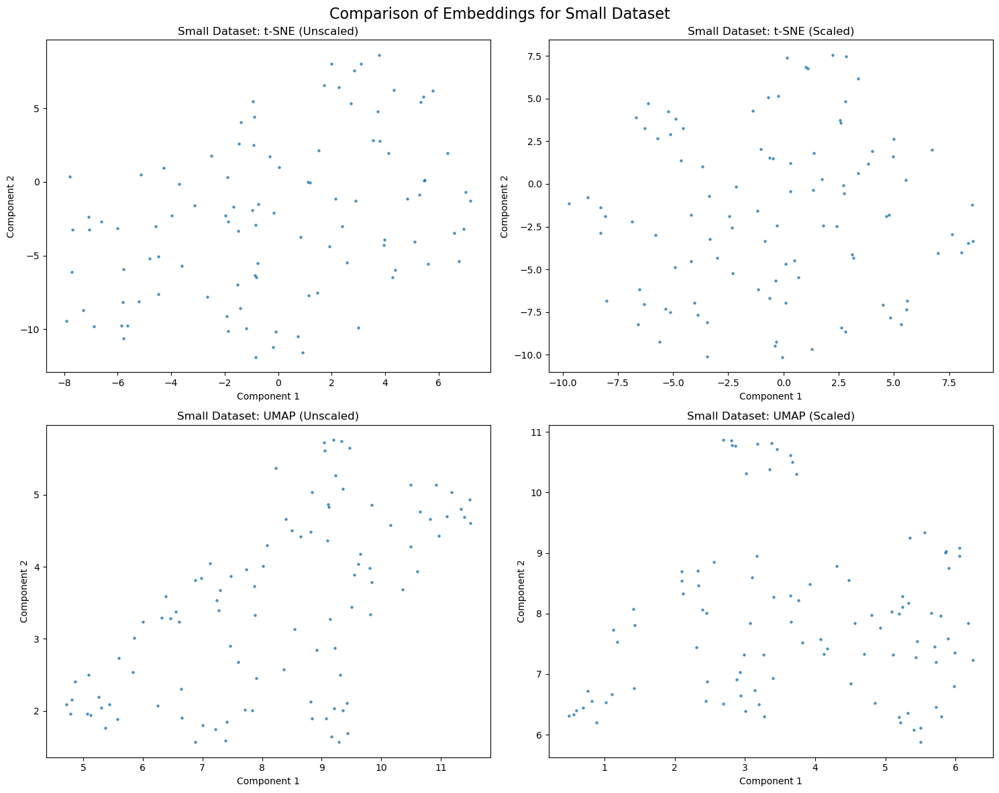

In [525]:
compare_visualizations_side_by_side(
    tsne_unscaled=small_embeddings_tsne, 
    tsne_scaled=small_embeddings_scaled_tsne, 
    umap_unscaled=small_embeddings_umap, 
    umap_scaled=small_embeddings_scaled_umap, 
    dataset_name="Small Dataset"
)

### Medium dataset:

/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/4055208196.py:15: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[0, 0].scatter(tsne_unscaled[:, 0], tsne_unscaled[:, 1], s=5, alpha=0.7, cmap='viridis')
/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/4055208196.py:21: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[0, 1].scatter(tsne_scaled[:, 0], tsne_scaled[:, 1], s=5, alpha=0.7, cmap='viridis')
/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/4055208196.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[1, 0].scatter(umap_unscaled[:, 0], umap_unscaled[:, 1], s=5, alpha=0.7, cmap='viridis')
/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/4055208196.py:33: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[1, 1].scatter(umap_s

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_2.jpg


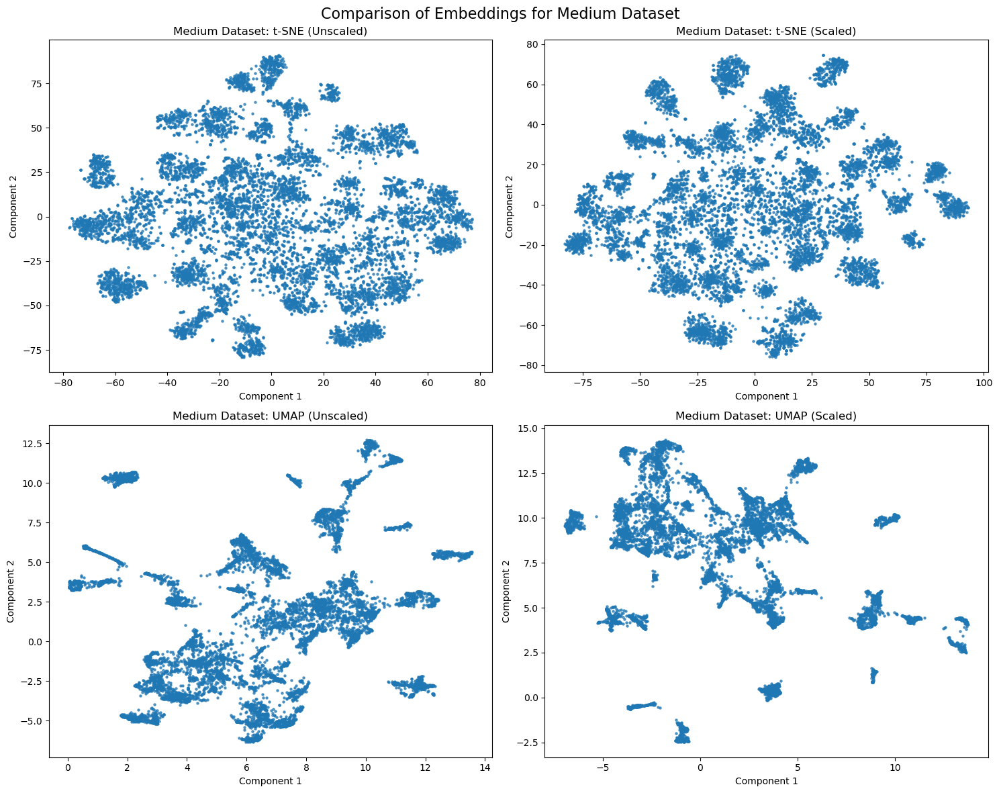

In [527]:
compare_visualizations_side_by_side(
    tsne_unscaled=medium_embeddings_tsne, 
    tsne_scaled=medium_embeddings_scaled_tsne, 
    umap_unscaled=medium_embeddings_umap, 
    umap_scaled=medium_embeddings_scaled_umap, 
    dataset_name="Medium Dataset"
)

### Large dataset:

/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/4055208196.py:15: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[0, 0].scatter(tsne_unscaled[:, 0], tsne_unscaled[:, 1], s=5, alpha=0.7, cmap='viridis')
/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/4055208196.py:21: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[0, 1].scatter(tsne_scaled[:, 0], tsne_scaled[:, 1], s=5, alpha=0.7, cmap='viridis')
/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/4055208196.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[1, 0].scatter(umap_unscaled[:, 0], umap_unscaled[:, 1], s=5, alpha=0.7, cmap='viridis')
/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/4055208196.py:33: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axes[1, 1].scatter(umap_s

Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_3.jpg


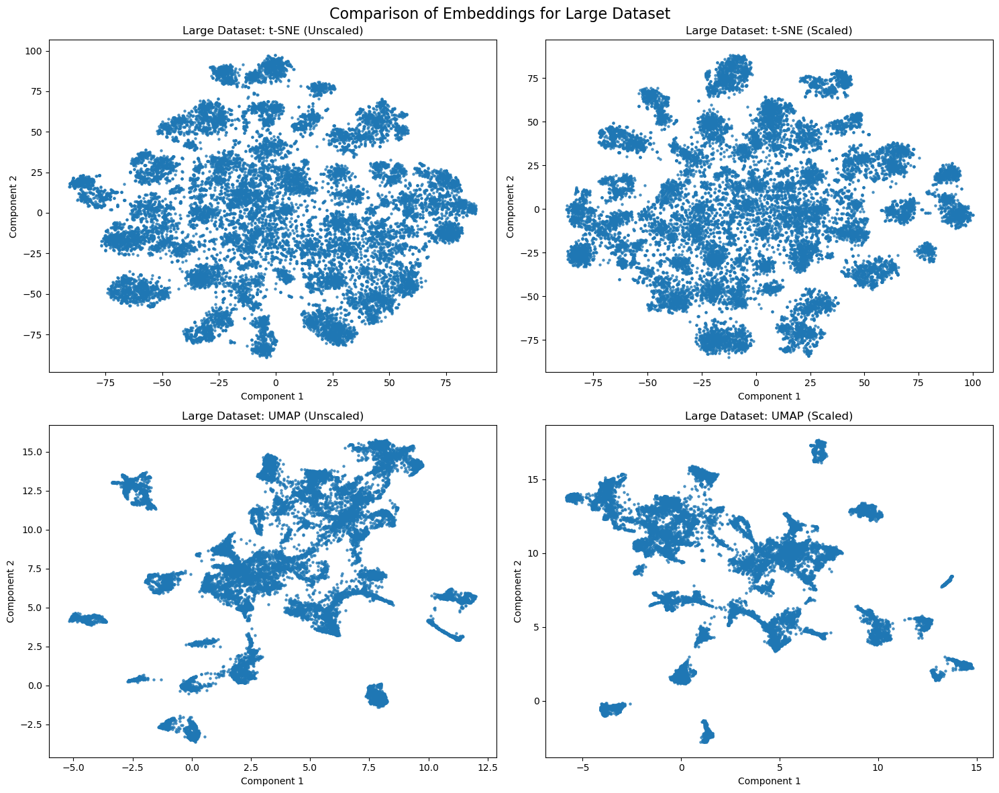

In [529]:
compare_visualizations_side_by_side(
    tsne_unscaled=large_embeddings_tsne, 
    tsne_scaled=large_embeddings_scaled_tsne, 
    umap_unscaled=large_embeddings_umap, 
    umap_scaled=large_embeddings_scaled_umap, 
    dataset_name="Large Dataset"
)

## 5.1 Clustering with KMeans:

## KMeans

## without PCA:

In [20]:
# Function to apply K-means clustering and calculate silhouette scores and save results
def apply_kmeans(embeddings, n_clusters_list, dataset_name, scaled, results):
    """
    Apply K-means clustering for multiple values of n_clusters, print results, and save clusters.

    Args:
        embeddings: High-dimensional embeddings (unscaled or scaled).
        n_clusters_list: List of cluster numbers to test.
        dataset_name: Name of the dataset (e.g., Small, Medium, Large).
        scaled: Boolean indicating whether the embeddings are scaled.
        results: Dictionary to store clustering results.
    """
    scale_status = "Scaled" if scaled else "Unscaled"
    print(f"\nApplying K-means on {dataset_name} ({scale_status}) embeddings:\n")

    for n_clusters in n_clusters_list:
        print(f"Applying K-means with {n_clusters} clusters...")
        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
        cluster_labels = kmeans.fit_predict(embeddings)

        silhouette_avg = silhouette_score(embeddings, cluster_labels)
        print(f"Silhouette Score for {n_clusters} clusters: {silhouette_avg:.4f}")

        key = f"{dataset_name}_{scale_status}_{n_clusters}"
        results[key] = {
            "labels": cluster_labels,
            "centroids": kmeans.cluster_centers_,
            "silhouette_score": silhouette_avg
        }

n_clusters_list = [3, 5, 10, 15, 25, 35, 50]
kmeans_results = {}

for dataset_name, dataset_key in [
    ("Small Dataset", "small"),
    ("Medium Dataset", "medium"),
    ("Large Dataset", "large")
]:
    unscaled_embeddings = embeddings[dataset_key]["unscaled"]
    scaled_embeddings = embeddings[dataset_key]["scaled"]

    apply_kmeans(unscaled_embeddings, n_clusters_list, dataset_name, scaled=False, results=kmeans_results)
    
    apply_kmeans(scaled_embeddings, n_clusters_list, dataset_name, scaled=True, results=kmeans_results)


Applying K-means on Small Dataset (Unscaled) embeddings:

Applying K-means with 3 clusters...
Silhouette Score for 3 clusters: 0.0479
Applying K-means with 5 clusters...
Silhouette Score for 5 clusters: 0.0620
Applying K-means with 10 clusters...
Silhouette Score for 10 clusters: 0.0787
Applying K-means with 15 clusters...
Silhouette Score for 15 clusters: 0.0806
Applying K-means with 25 clusters...
Silhouette Score for 25 clusters: 0.0895
Applying K-means with 35 clusters...
Silhouette Score for 35 clusters: 0.0955
Applying K-means with 50 clusters...
Silhouette Score for 50 clusters: 0.0831

Applying K-means on Small Dataset (Scaled) embeddings:

Applying K-means with 3 clusters...
Silhouette Score for 3 clusters: 0.0374
Applying K-means with 5 clusters...
Silhouette Score for 5 clusters: 0.0533
Applying K-means with 10 clusters...
Silhouette Score for 10 clusters: 0.0642
Applying K-means with 15 clusters...
Silhouette Score for 15 clusters: 0.0787
Applying K-means with 25 clusters.

In [32]:
# Function to visualize K-means clustering results
def visualize_kmeans(embeddings, cluster_labels, title):
    """
    Visualize K-means clustering using a scatter plot.

    Args:
        embeddings: High-dimensional embeddings (unscaled or scaled).
        cluster_labels: Cluster labels assigned by K-means.
        title: Title of the plot.
    """
    plt.figure(figsize=(8, 6))
    plt.scatter(embeddings[:, 0], embeddings[:, 1], c=cluster_labels, cmap='tab10', s=5, alpha=0.7)
    plt.colorbar()
    plt.title(title)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

# Function to visualize K-means results side by side
def visualize_kmeans_side_by_side(embeddings_unscaled, labels_unscaled, embeddings_scaled, labels_scaled, dataset_name, n_clusters):
    """
    Visualize K-means clustering for unscaled and scaled embeddings side by side.

    Args:
        embeddings_unscaled: Unscaled embeddings.
        labels_unscaled: Cluster labels for unscaled embeddings.
        embeddings_scaled: Scaled embeddings.
        labels_scaled: Cluster labels for scaled embeddings.
        dataset_name: Name of the dataset.
        n_clusters: Number of clusters used in K-means.
    """
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    axes[0].scatter(embeddings_unscaled[:, 0], embeddings_unscaled[:, 1], c=labels_unscaled, cmap='tab10', s=5, alpha=0.7)
    axes[0].set_title(f'{dataset_name} (Unscaled, k={n_clusters})')
    axes[0].set_xlabel('Feature 1')
    axes[0].set_ylabel('Feature 2')
    
    axes[1].scatter(embeddings_scaled[:, 0], embeddings_scaled[:, 1], c=labels_scaled, cmap='tab10', s=5, alpha=0.7)
    axes[1].set_title(f'{dataset_name} (Scaled, k={n_clusters})')
    axes[1].set_xlabel('Feature 1')
    axes[1].set_ylabel('Feature 2')
    
    plt.tight_layout()
    save_current_figure_sequentially()
    plt.show()

n_clusters_list = [10]

In [34]:
for n_clusters in n_clusters_list:
    for dataset_name, embeddings, embeddings_scaled in [
        ("Small Dataset", small_embeddings, small_embeddings_scaled),
        ("Medium Dataset", medium_embeddings, medium_embeddings_scaled),
        ("Large Dataset", large_embeddings, large_embeddings_scaled)
    ]:

        labels_unscaled = kmeans_results[f"{dataset_name}_Unscaled_{n_clusters}"]["labels"]
        labels_scaled = kmeans_results[f"{dataset_name}_Scaled_{n_clusters}"]["labels"]

        visualize_kmeans_side_by_side(
            embeddings, labels_unscaled,
            embeddings_scaled, labels_scaled,
            dataset_name, n_clusters
        )

NameError: name 'small_embeddings' is not defined

## KMeans to explore data:

## with PCA:

### Comments:

- I tried both n_components = 50 and variance_threshold = 0.95.

- While 50 components explained between 50-85% of the variance, I had to have more than 100 components to reach 95% in the 100 images subset.

## Components:
### Unscaled:
- Small dataset: Total explained variance: 0.8573
- Medium dataset: Total explained variance: 0.6283
- Large dataset: Total explained variance: 0.6283

### Scaled:
- Small dataset: Total explained variance: 0.8102
- Medium dataset: Total explained variance: 0.5037
- Large dataset: Total explained variance: 0.5020

## 95% Variance:
## Unscaled:
- 

## Scaled:
-

In [5]:
# Apply PCA

def apply_pca(embeddings, n_components=50, verbose=True):
    """
    Apply PCA to reduce dimensionality of embeddings.

    Args:
        embeddings: High-dimensional embeddings (NumPy array).
        n_components: Number of principal components to retain.
        verbose: If True, print detailed information about PCA results.

    Returns:
        reduced_embeddings: PCA-reduced embeddings (NumPy array).
        pca: Fitted PCA model.
    """
    if verbose:
        print(f"Applying PCA to reduce dimensions to {n_components} components...")
    
    pca = PCA(n_components=n_components, random_state=42)
    reduced_embeddings = pca.fit_transform(embeddings)
    
    if verbose:
        print(f"Original shape: {embeddings.shape}")
        print(f"Reduced shape: {reduced_embeddings.shape}")
        
        cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
        print("\nCumulative Explained Variance:")
        for i, var in enumerate(cumulative_variance, 1):
            print(f"{i} components: {var:.4f}")
        
        print(f"\nTotal explained variance: {cumulative_variance[-1]:.4f}")
    
    return reduced_embeddings, pca

# Apply PCA to all datasets
def process_dataset_pca(unscaled_embeddings, scaled_embeddings, n_components=50):
    """
    Apply PCA to both unscaled and scaled embeddings for a dataset.

    Args:
        unscaled_embeddings: Original embeddings (NumPy array).
        scaled_embeddings: Scaled embeddings (NumPy array).
        n_components: Number of PCA components to retain.

    Returns:
        Tuple of results for unscaled and scaled embeddings: 
        (reduced_unscaled, pca_unscaled, reduced_scaled, pca_scaled)
    """
    print("\nProcessing PCA for unscaled embeddings...")
    reduced_unscaled, pca_unscaled = apply_pca(unscaled_embeddings, n_components)
    
    print("\nProcessing PCA for scaled embeddings...")
    reduced_scaled, pca_scaled = apply_pca(scaled_embeddings, n_components)
    
    return reduced_unscaled, pca_unscaled, reduced_scaled, pca_scaled

#### Small Dataset:

In [268]:
print("Small Dataset PCA:")
small_embeddings_pca, small_pca, small_embeddings_scaled_pca, small_scaled_pca = process_dataset_pca(
    small_embeddings, small_embeddings_scaled, n_components=50
)

Small Dataset PCA:

Processing PCA for unscaled embeddings...
Applying PCA to reduce dimensions to 50 components...
Original shape: (100, 512)
Reduced shape: (100, 50)

Cumulative Explained Variance:
1 components: 0.0784
2 components: 0.1464
3 components: 0.1966
4 components: 0.2404
5 components: 0.2774
6 components: 0.3122
7 components: 0.3463
8 components: 0.3752
9 components: 0.4003
10 components: 0.4242
11 components: 0.4464
12 components: 0.4679
13 components: 0.4890
14 components: 0.5082
15 components: 0.5260
16 components: 0.5424
17 components: 0.5578
18 components: 0.5730
19 components: 0.5878
20 components: 0.6015
21 components: 0.6149
22 components: 0.6277
23 components: 0.6402
24 components: 0.6520
25 components: 0.6632
26 components: 0.6741
27 components: 0.6845
28 components: 0.6946
29 components: 0.7046
30 components: 0.7144
31 components: 0.7239
32 components: 0.7330
33 components: 0.7416
34 components: 0.7500
35 components: 0.7583
36 components: 0.7663
37 components: 0.

#### Medium Dataset:

In [271]:
print("\nMedium Dataset PCA:")
medium_embeddings_pca, medium_pca, medium_embeddings_scaled_pca, medium_scaled_pca = process_dataset_pca(
    medium_embeddings, medium_embeddings_scaled, n_components=50
)


Medium Dataset PCA:

Processing PCA for unscaled embeddings...
Applying PCA to reduce dimensions to 50 components...
Original shape: (10000, 512)
Reduced shape: (10000, 50)

Cumulative Explained Variance:
1 components: 0.0618
2 components: 0.1104
3 components: 0.1563
4 components: 0.1909
5 components: 0.2209
6 components: 0.2483
7 components: 0.2714
8 components: 0.2929
9 components: 0.3131
10 components: 0.3310
11 components: 0.3486
12 components: 0.3634
13 components: 0.3772
14 components: 0.3908
15 components: 0.4037
16 components: 0.4161
17 components: 0.4279
18 components: 0.4389
19 components: 0.4487
20 components: 0.4582
21 components: 0.4673
22 components: 0.4758
23 components: 0.4841
24 components: 0.4920
25 components: 0.4995
26 components: 0.5069
27 components: 0.5138
28 components: 0.5207
29 components: 0.5273
30 components: 0.5336
31 components: 0.5398
32 components: 0.5457
33 components: 0.5515
34 components: 0.5571
35 components: 0.5625
36 components: 0.5678
37 componen

#### Large Dataset:

In [274]:
print("\nLarge Dataset PCA:")
large_embeddings_pca, large_pca, large_embeddings_scaled_pca, large_scaled_pca = process_dataset_pca(
    large_embeddings, large_embeddings_scaled, n_components=50
)


Large Dataset PCA:

Processing PCA for unscaled embeddings...
Applying PCA to reduce dimensions to 50 components...
Original shape: (20000, 512)
Reduced shape: (20000, 50)

Cumulative Explained Variance:
1 components: 0.0615
2 components: 0.1106
3 components: 0.1568
4 components: 0.1909
5 components: 0.2210
6 components: 0.2487
7 components: 0.2716
8 components: 0.2933
9 components: 0.3134
10 components: 0.3314
11 components: 0.3488
12 components: 0.3636
13 components: 0.3772
14 components: 0.3907
15 components: 0.4037
16 components: 0.4160
17 components: 0.4277
18 components: 0.4385
19 components: 0.4484
20 components: 0.4577
21 components: 0.4666
22 components: 0.4751
23 components: 0.4833
24 components: 0.4911
25 components: 0.4987
26 components: 0.5059
27 components: 0.5128
28 components: 0.5196
29 components: 0.5262
30 components: 0.5325
31 components: 0.5386
32 components: 0.5445
33 components: 0.5503
34 components: 0.5558
35 components: 0.5612
36 components: 0.5665
37 component

## Visualize KMeans and PCA (50 components)

In [535]:
def apply_kmeans_and_visualize_grouped(pca_embeddings, n_clusters_list, title_prefix="Dataset", results=None, suppress_details=True):
    """
    Apply K-means clustering on PCA-reduced embeddings, visualize results, and save clusters.

    Args:
        pca_embeddings: PCA-reduced embeddings (NumPy array).
        n_clusters_list: List of cluster numbers to try (list of ints).
        title_prefix: Prefix for plot titles (string).
        results: Dictionary to store clustering results (default: None).
        suppress_details: Whether to suppress detailed results (default: True).
    """
    num_plots = len(n_clusters_list)
    fig, axes = plt.subplots(1, num_plots, figsize=(6 * num_plots, 6), sharex=True, sharey=True)
    
    if num_plots == 1:
        axes = [axes]
        
    if results is None:
        results = {}

    print(f"K-means clustering results for {title_prefix}:")

    for i, n_clusters in enumerate(n_clusters_list):
        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')
        cluster_labels = kmeans.fit_predict(pca_embeddings)
        
        silhouette_avg = silhouette_score(pca_embeddings, cluster_labels)
        
        key = f"{title_prefix}_{'Scaled' if 'Scaled' in title_prefix else 'Unscaled'}_{n_clusters}"
        if suppress_details:
            results[key] = {
                "silhouette_score": silhouette_avg
            }
        else:
            results[key] = {
                "labels": cluster_labels,
                "centroids": kmeans.cluster_centers_,
                "silhouette_score": silhouette_avg
            }

        print(f"  {n_clusters} Clusters: Silhouette Score = {silhouette_avg:.4f}")
        
        scatter = axes[i].scatter(pca_embeddings[:, 0], pca_embeddings[:, 1], c=cluster_labels, cmap='viridis', s=5)
        axes[i].set_title(f"{n_clusters} Clusters (Silhouette: {silhouette_avg:.2f})")
        axes[i].set_xlabel("PCA Dimension 1")
        if i == 0:
            axes[i].set_ylabel("PCA Dimension 2")
        fig.colorbar(scatter, ax=axes[i], label="Cluster Label")
    
    fig.suptitle(f"{title_prefix} - K-means Clustering", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    save_current_figure_sequentially()
    plt.show()

    return results

In [245]:
kmeans_results = {}

### Small dataset -- PCA on unscaled and scaled CLIP embeddings

Processing Small Dataset (Unscaled PCA):
K-means clustering results for Small Dataset with Unscaled PCA:
  5 Clusters: Silhouette Score = 0.0572
  10 Clusters: Silhouette Score = 0.1059
  25 Clusters: Silhouette Score = 0.1371
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_7.jpg


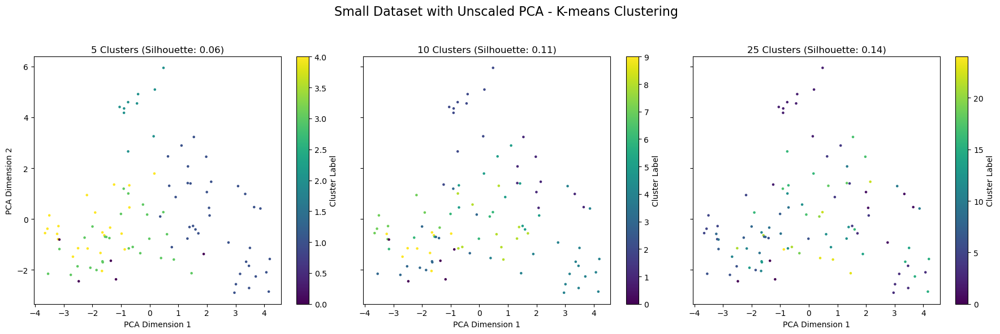


Processing Small Dataset (Scaled PCA):
K-means clustering results for Small Dataset with Scaled PCA:
  5 Clusters: Silhouette Score = 0.0537
  10 Clusters: Silhouette Score = 0.0773
  25 Clusters: Silhouette Score = 0.1339
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_8.jpg


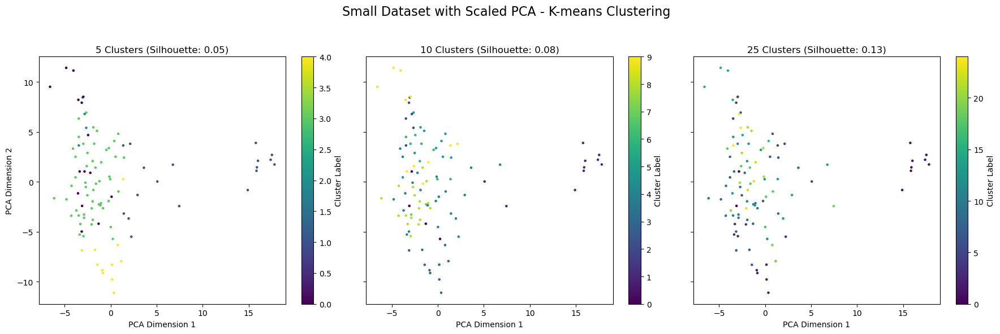

{'Small Dataset_Unscaled_3': {'labels': array([1, 0, 0, 0, 1, 2, 1, 2, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 2, 1,
         0, 1, 0, 1, 1, 0, 2, 0, 1, 1, 1, 0, 1, 0, 0, 0, 2, 0, 1, 0, 1, 0,
         2, 1, 1, 0, 0, 2, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 2,
         0, 0, 0, 1, 0, 0, 0, 1, 2, 1, 0, 0, 0, 0, 1, 1, 0, 1, 2, 1, 1, 1,
         0, 0, 1, 2, 0, 0, 1, 0, 1, 1, 0, 0], dtype=int32),
  'centroids': array([[-0.04767791,  0.2911015 ,  0.01829504, ...,  0.65566818,
           0.00734644,  0.01123424],
         [-0.01976634,  0.07895749, -0.02996822, ...,  0.32242815,
          -0.04426709, -0.10812719],
         [-0.09600275, -0.12529963, -0.06895031, ...,  0.32393577,
          -0.06331773,  0.01080582]]),
  'silhouette_score': 0.04791758228689937},
 'Small Dataset_Unscaled_5': {'labels': array([3, 4, 4, 4, 1, 2, 3, 2, 1, 3, 1, 1, 2, 0, 3, 1, 4, 0, 0, 3, 2, 3,
         1, 3, 4, 1, 1, 4, 2, 1, 3, 1, 3, 0, 2, 0, 4, 0, 2, 4, 1, 4, 4, 4,
         2, 1, 1, 4, 4, 2, 1, 4, 0, 1, 1, 2

In [537]:
print("Processing Small Dataset (Unscaled PCA):")
apply_kmeans_and_visualize_grouped(
    small_embeddings_pca,
    n_clusters_list=[5, 10, 25],
    title_prefix="Small Dataset with Unscaled PCA",
    results=kmeans_results,
    suppress_details=True
)

print("\nProcessing Small Dataset (Scaled PCA):")
apply_kmeans_and_visualize_grouped(
    small_embeddings_scaled_pca,
    n_clusters_list=[5, 10, 25],
    title_prefix="Small Dataset with Scaled PCA",
    results=kmeans_results,
    suppress_details=True
)

### Medium dataset -- PCA on unscaled and scaled CLIP embeddings

Processing Medium Dataset (Unscaled PCA):
K-means clustering results for Medium Dataset with Unscaled PCA:
  5 Clusters: Silhouette Score = 0.1040
  10 Clusters: Silhouette Score = 0.1245
  25 Clusters: Silhouette Score = 0.1309
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_9.jpg


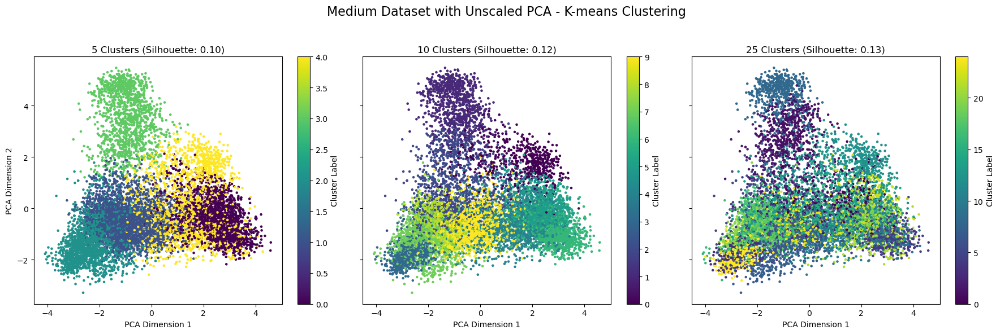


Processing Medium Dataset (Scaled PCA):
K-means clustering results for Medium Dataset with Scaled PCA:
  5 Clusters: Silhouette Score = 0.0946
  10 Clusters: Silhouette Score = 0.1260
  25 Clusters: Silhouette Score = 0.1366
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_10.jpg


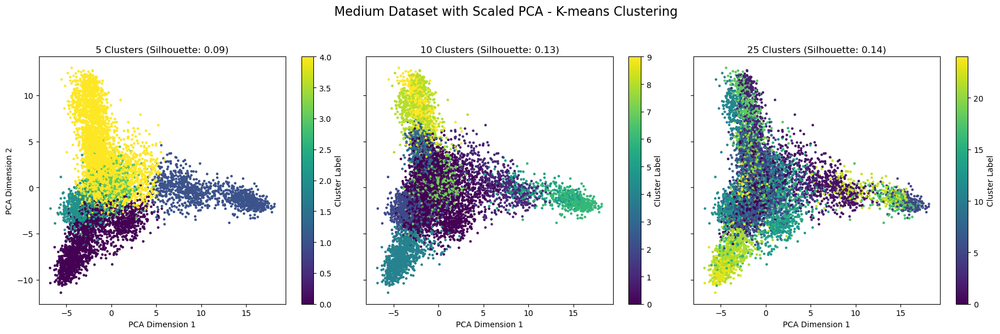

{'Small Dataset_Unscaled_3': {'labels': array([1, 0, 0, 0, 1, 2, 1, 2, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 2, 1,
         0, 1, 0, 1, 1, 0, 2, 0, 1, 1, 1, 0, 1, 0, 0, 0, 2, 0, 1, 0, 1, 0,
         2, 1, 1, 0, 0, 2, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 2,
         0, 0, 0, 1, 0, 0, 0, 1, 2, 1, 0, 0, 0, 0, 1, 1, 0, 1, 2, 1, 1, 1,
         0, 0, 1, 2, 0, 0, 1, 0, 1, 1, 0, 0], dtype=int32),
  'centroids': array([[-0.04767791,  0.2911015 ,  0.01829504, ...,  0.65566818,
           0.00734644,  0.01123424],
         [-0.01976634,  0.07895749, -0.02996822, ...,  0.32242815,
          -0.04426709, -0.10812719],
         [-0.09600275, -0.12529963, -0.06895031, ...,  0.32393577,
          -0.06331773,  0.01080582]]),
  'silhouette_score': 0.04791758228689937},
 'Small Dataset_Unscaled_5': {'labels': array([3, 4, 4, 4, 1, 2, 3, 2, 1, 3, 1, 1, 2, 0, 3, 1, 4, 0, 0, 3, 2, 3,
         1, 3, 4, 1, 1, 4, 2, 1, 3, 1, 3, 0, 2, 0, 4, 0, 2, 4, 1, 4, 4, 4,
         2, 1, 1, 4, 4, 2, 1, 4, 0, 1, 1, 2

In [539]:
print("Processing Medium Dataset (Unscaled PCA):")
apply_kmeans_and_visualize_grouped(
    medium_embeddings_pca,
    n_clusters_list=[5, 10, 25],
    title_prefix="Medium Dataset with Unscaled PCA",
    results=kmeans_results,
    suppress_details=True
)

print("\nProcessing Medium Dataset (Scaled PCA):")
apply_kmeans_and_visualize_grouped(
    medium_embeddings_scaled_pca,
    n_clusters_list=[5, 10, 25],
    title_prefix="Medium Dataset with Scaled PCA",
    results=kmeans_results,
    suppress_details=True
)

### Large dataset -- PCA on unscaled and scaled CLIP embeddings

Processing Large Dataset (Unscaled PCA):
K-means clustering results for Large Dataset with Unscaled PCA:
  5 Clusters: Silhouette Score = 0.1071
  10 Clusters: Silhouette Score = 0.1270
  25 Clusters: Silhouette Score = 0.1302
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_11.jpg


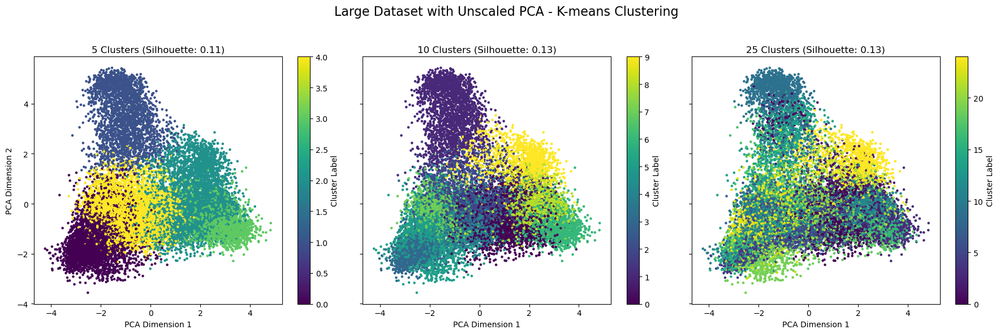


Processing Large Dataset (Scaled PCA):
K-means clustering results for Large Dataset with Scaled PCA:
  5 Clusters: Silhouette Score = 0.0864
  10 Clusters: Silhouette Score = 0.1064
  25 Clusters: Silhouette Score = 0.1583
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_12.jpg


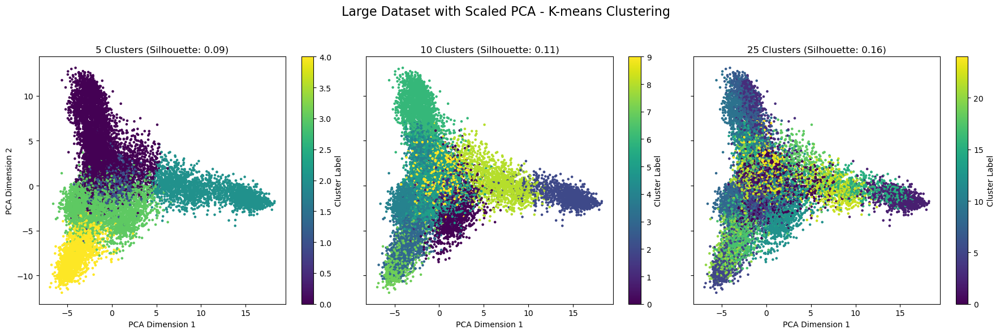

{'Small Dataset_Unscaled_3': {'labels': array([1, 0, 0, 0, 1, 2, 1, 2, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 2, 1,
         0, 1, 0, 1, 1, 0, 2, 0, 1, 1, 1, 0, 1, 0, 0, 0, 2, 0, 1, 0, 1, 0,
         2, 1, 1, 0, 0, 2, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 2,
         0, 0, 0, 1, 0, 0, 0, 1, 2, 1, 0, 0, 0, 0, 1, 1, 0, 1, 2, 1, 1, 1,
         0, 0, 1, 2, 0, 0, 1, 0, 1, 1, 0, 0], dtype=int32),
  'centroids': array([[-0.04767791,  0.2911015 ,  0.01829504, ...,  0.65566818,
           0.00734644,  0.01123424],
         [-0.01976634,  0.07895749, -0.02996822, ...,  0.32242815,
          -0.04426709, -0.10812719],
         [-0.09600275, -0.12529963, -0.06895031, ...,  0.32393577,
          -0.06331773,  0.01080582]]),
  'silhouette_score': 0.04791758228689937},
 'Small Dataset_Unscaled_5': {'labels': array([3, 4, 4, 4, 1, 2, 3, 2, 1, 3, 1, 1, 2, 0, 3, 1, 4, 0, 0, 3, 2, 3,
         1, 3, 4, 1, 1, 4, 2, 1, 3, 1, 3, 0, 2, 0, 4, 0, 2, 4, 1, 4, 4, 4,
         2, 1, 1, 4, 4, 2, 1, 4, 0, 1, 1, 2

In [541]:
print("Processing Large Dataset (Unscaled PCA):")
apply_kmeans_and_visualize_grouped(
    large_embeddings_pca,
    n_clusters_list=[5, 10, 25],
    title_prefix="Large Dataset with Unscaled PCA",
    results=kmeans_results,
    suppress_details=True
)

print("\nProcessing Large Dataset (Scaled PCA):")
apply_kmeans_and_visualize_grouped(
    large_embeddings_scaled_pca,
    n_clusters_list=[5, 10, 25],
    title_prefix="Large Dataset with Scaled PCA",
    results=kmeans_results,
    suppress_details=True
)

## K-means and PCA -- number of PCA components to capture 95% variance:

In [581]:
def apply_pca_variance(embeddings, variance_threshold=0.95, verbose=True):
    """
    Apply PCA to reduce dimensionality of embeddings based on a variance threshold.

    Args:
        embeddings: High-dimensional embeddings (NumPy array).
        variance_threshold: Fraction of variance to retain (float between 0 and 1).
        verbose: If True, print detailed information about PCA results.

    Returns:
        reduced_embeddings: PCA-reduced embeddings (NumPy array).
        pca: Fitted PCA model.
    """
    if verbose:
        print(f"Applying PCA to retain {variance_threshold * 100:.2f}% of variance...")
    
    pca = PCA(n_components=variance_threshold, random_state=42)
    reduced_embeddings = pca.fit_transform(embeddings)
    
    if verbose:
        print(f"Original shape: {embeddings.shape}")
        print(f"Reduced shape: {reduced_embeddings.shape}")
        
        # Report cumulative explained variance
        cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
        total_components = len(cumulative_variance)

        print("\nCumulative Explained Variance:")
        steps = [1] + list(range(50, total_components, 50)) + [total_components]
        for i in steps:
            if i <= total_components:
                print(f"{i} components: {cumulative_variance[i-1]:.4f}")
        
        print(f"\nTotal explained variance: {cumulative_variance[-1]:.4f}")

    return reduced_embeddings, pca

def process_dataset_pca_variance(unscaled_embeddings, scaled_embeddings, variance_threshold=0.95):
    """
    Apply PCA to both unscaled and scaled embeddings for a dataset.

    Args:
        unscaled_embeddings: Original embeddings (NumPy array).
        scaled_embeddings: Scaled embeddings (NumPy array).
        variance_threshold: Fraction of variance to retain (float between 0 and 1).

    Returns:
        Tuple of results for unscaled and scaled embeddings: 
        (reduced_unscaled, pca_unscaled, reduced_scaled, pca_scaled)
    """
    print("\nProcessing PCA for unscaled embeddings...")
    reduced_unscaled, pca_unscaled = apply_pca_variance(unscaled_embeddings, variance_threshold)
    
    print("\nProcessing PCA for scaled embeddings...")
    reduced_scaled, pca_scaled = apply_pca_variance(scaled_embeddings, variance_threshold)
    
    return reduced_unscaled, pca_unscaled, reduced_scaled, pca_scaled

## Small dataset -- 95% variance

In [585]:
print("\nSmall Dataset PCA:")
small_embeddings_pca, small_pca, small_embeddings_scaled_pca, small_scaled_pca = process_dataset_pca_variance(
    small_embeddings, small_embeddings_scaled, variance_threshold=0.95
)


Small Dataset PCA:

Processing PCA for unscaled embeddings...
Applying PCA to retain 95.00% of variance...
Original shape: (100, 512)
Reduced shape: (100, 73)

Cumulative Explained Variance:
1 components: 0.0784
50 components: 0.8579
73 components: 0.9519

Total explained variance: 0.9519

Processing PCA for scaled embeddings...
Applying PCA to retain 95.00% of variance...
Original shape: (100, 512)
Reduced shape: (100, 78)

Cumulative Explained Variance:
1 components: 0.0566
50 components: 0.8113
78 components: 0.9531

Total explained variance: 0.9531


## Medium dataset -- 95% variance

In [534]:
print("\nMedium Dataset PCA:")
medium_embeddings_pca, medium_pca, medium_embeddings_scaled_pca, medium_scaled_pca = process_dataset_pca(
    medium_embeddings, medium_embeddings_scaled, variance_threshold=0.95
)


Medium Dataset PCA:

Processing PCA for unscaled embeddings...
Applying PCA to retain 95.00% of variance...
Original shape: (10000, 512)
Reduced shape: (10000, 296)

Cumulative Explained Variance:
1 components: 0.0618
50 components: 0.6300
100 components: 0.7592
150 components: 0.8337
200 components: 0.8853
250 components: 0.9235
296 components: 0.9500

Total explained variance: 0.9500

Processing PCA for scaled embeddings...
Applying PCA to retain 95.00% of variance...
Original shape: (10000, 512)
Reduced shape: (10000, 324)

Cumulative Explained Variance:
1 components: 0.0403
50 components: 0.5040
100 components: 0.6668
150 components: 0.7685
200 components: 0.8411
250 components: 0.8951
300 components: 0.9351
324 components: 0.9504

Total explained variance: 0.9504


## Large dataset -- 95% variance

In [537]:
print("\nLarge Dataset PCA:")
large_embeddings_pca, large_pca, large_embeddings_scaled_pca, large_scaled_pca = process_dataset_pca(
    large_embeddings, large_embeddings_scaled, variance_threshold=0.95
)


Large Dataset PCA:

Processing PCA for unscaled embeddings...
Applying PCA to retain 95.00% of variance...
Original shape: (20000, 512)
Reduced shape: (20000, 299)

Cumulative Explained Variance:
1 components: 0.0615
50 components: 0.6285
100 components: 0.7573
150 components: 0.8314
200 components: 0.8830
250 components: 0.9216
299 components: 0.9502

Total explained variance: 0.9502

Processing PCA for scaled embeddings...
Applying PCA to retain 95.00% of variance...
Original shape: (20000, 512)
Reduced shape: (20000, 326)

Cumulative Explained Variance:
1 components: 0.0409
50 components: 0.5023
100 components: 0.6639
150 components: 0.7653
200 components: 0.8380
250 components: 0.8925
300 components: 0.9334
326 components: 0.9501

Total explained variance: 0.9501


# 6. Optimization:

- I realize that KMeans (centroid) and PCA might not capture the data in the NSD-dataset, which is 

## Results - number of components for 95% variance:

#### Unscaled:
- Small dataset: Reduced shape: (100, 73)
- Medium dataset: Reduced shape: (10000, 296)
- Large dataset: Reduced shape: (20000, 299)

#### Scaled:
- Small dataset: Reduced shape: (100, 78)
- Medium dataset: Reduced shape: (10000, 324)
-  Large dataset: Reduced shape: (20000, 326)

## t-SNE and UMAP on the reduced components (PCA) of the CLIP embeddings

In [543]:
def apply_tsne_umap(reduced_embeddings, method="t-SNE", n_neighbors=15, min_dist=0.1):
    """
    Apply t-SNE or UMAP to PCA-reduced embeddings and visualize results.

    Args:
        reduced_embeddings: PCA-reduced embeddings (NumPy array).
        method: "t-SNE" or "UMAP".
        n_neighbors: UMAP-specific parameter for the number of neighbors.
        min_dist: UMAP-specific parameter for minimum distance.

    Returns:
        Embedded 2D data (NumPy array).
    """
    if method == "t-SNE":
        print("Applying t-SNE...")
        tsne = TSNE(n_components=2, random_state=42, perplexity=30)
        embedded = tsne.fit_transform(reduced_embeddings)
    elif method == "UMAP":
        print("Applying UMAP...")
        umap_model = umap.UMAP(n_components=2, n_neighbors=n_neighbors, min_dist=min_dist, random_state=42)
        embedded = umap_model.fit_transform(reduced_embeddings)
    else:
        raise ValueError("Invalid method. Choose 't-SNE' or 'UMAP'.")

    plt.figure(figsize=(6, 6))
    plt.scatter(embedded[:, 0], embedded[:, 1], s=5, cmap='viridis')
    plt.title(f"{method} Projection")
    save_current_figure_sequentially()
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.show()

    return embedded

## Small dataset

Applying t-SNE...
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_13.jpg


/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/2603936476.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(embedded[:, 0], embedded[:, 1], s=5, cmap='viridis')


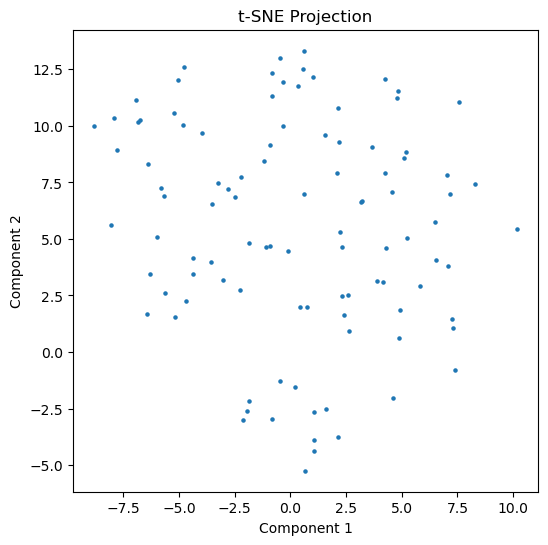

/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Applying UMAP...
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_14.jpg


/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/2603936476.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(embedded[:, 0], embedded[:, 1], s=5, cmap='viridis')


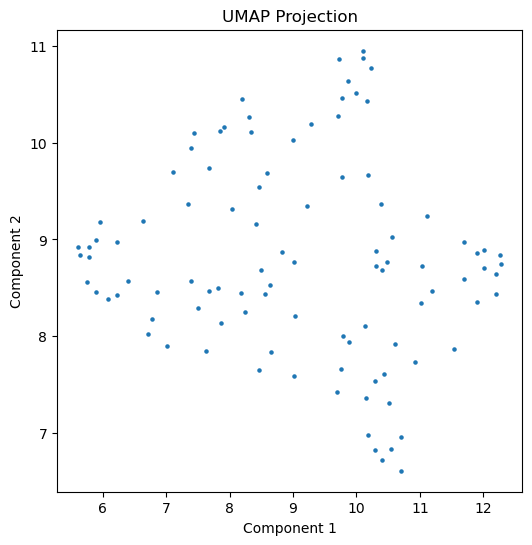

In [546]:
small_tsne = apply_tsne_umap(small_embeddings_pca, method="t-SNE")
small_umap = apply_tsne_umap(small_embeddings_pca, method="UMAP")

## Medium dataset

Applying t-SNE...
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_15.jpg


/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/2603936476.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(embedded[:, 0], embedded[:, 1], s=5, cmap='viridis')


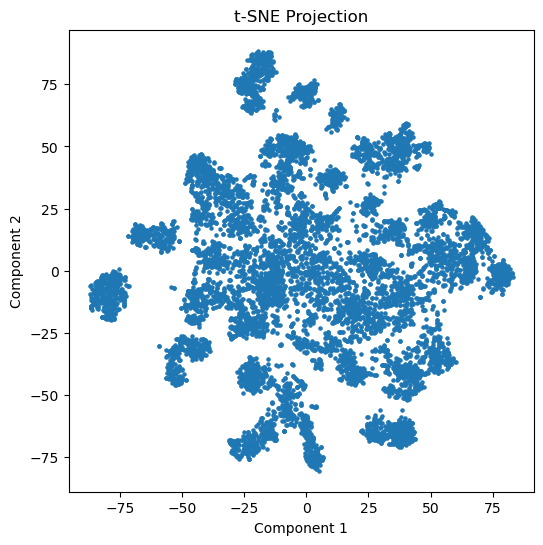

/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Applying UMAP...
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_16.jpg


/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/2603936476.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(embedded[:, 0], embedded[:, 1], s=5, cmap='viridis')


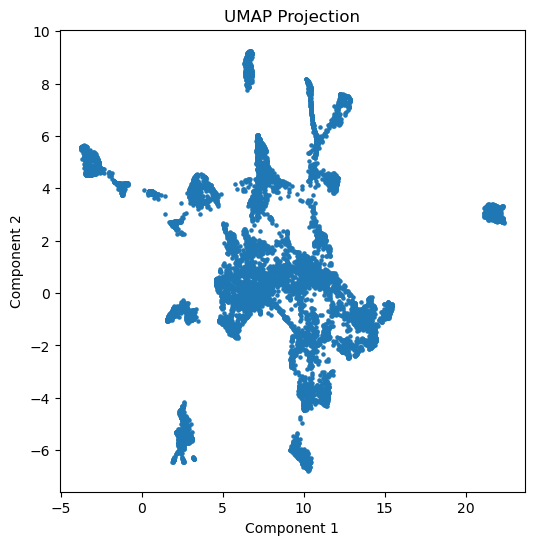

In [548]:
medium_tsne = apply_tsne_umap(medium_embeddings_pca, method="t-SNE")
medium_umap = apply_tsne_umap(medium_embeddings_pca, method="UMAP")

## Large dataset

Applying t-SNE...
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_17.jpg


/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/2603936476.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(embedded[:, 0], embedded[:, 1], s=5, cmap='viridis')


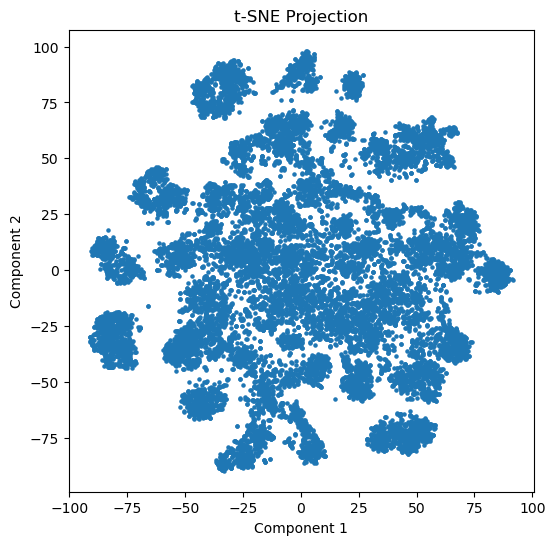

/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Applying UMAP...
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_18.jpg


/var/folders/kb/t8njst5d1qg_hr3b0_jq9s2r0000gn/T/ipykernel_82475/2603936476.py:27: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(embedded[:, 0], embedded[:, 1], s=5, cmap='viridis')


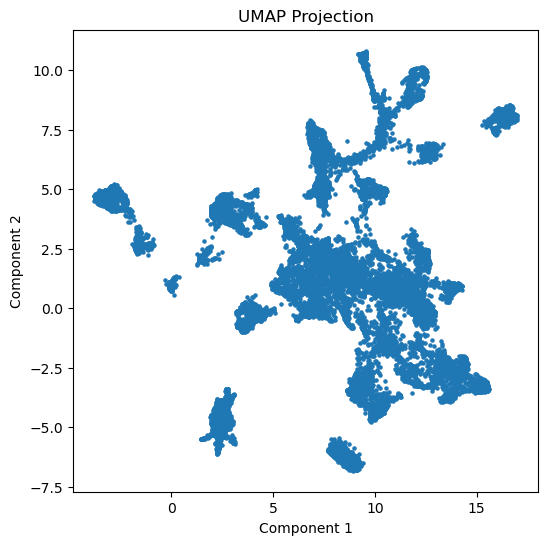

In [550]:
large_tsne = apply_tsne_umap(large_embeddings_pca, method="t-SNE")
large_umap = apply_tsne_umap(large_embeddings_pca, method="UMAP")

In [555]:
def apply_kmeans_tsne(embedded_data, n_clusters_list, dataset_name):
    """
    Apply K-means clustering on t-SNE embeddings and visualize results.

    Args:
        embedded_data: 2D array of embedded data
        n_clusters_list: List of cluster numbers to try
        dataset_name: Name of the dataset (string)

    Returns:
        A dictionary of K-means results (cluster labels and silhouette scores) for each n_clusters.
    """
    kmeans_results_tsne = {}

    for n_clusters in n_clusters_list:
        print(f"Applying K-means with {n_clusters} clusters on {dataset_name}...")

        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')
        cluster_labels = kmeans.fit_predict(embedded_data)
        
        silhouette_avg = silhouette_score(embedded_data, cluster_labels)
        print(f"Silhouette Score for {n_clusters} clusters: {silhouette_avg:.4f}")
        
        kmeans_results[n_clusters] = {
            "labels": cluster_labels,
            "silhouette_score": silhouette_avg
        }
        
        plt.figure(figsize=(6, 6))
        scatter = plt.scatter(embedded_data[:, 0], embedded_data[:, 1], c=cluster_labels, cmap='viridis', s=5)
        plt.colorbar(scatter, label="Cluster Label")
        plt.title(f"{dataset_name} - {n_clusters} Clusters (Silhouette: {silhouette_avg:.2f})")
        save_current_figure_sequentially()
        plt.xlabel("Component 1")
        plt.ylabel("Component 2")
        plt.show()

    return kmeans_results_tsne

n_clusters_list = [3, 5, 8, 15, 25, 35, 50, 80]


Small Dataset Clustering:
Applying K-means with 3 clusters on Small Dataset with t-SNE...
Silhouette Score for 3 clusters: 0.4022
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_19.jpg


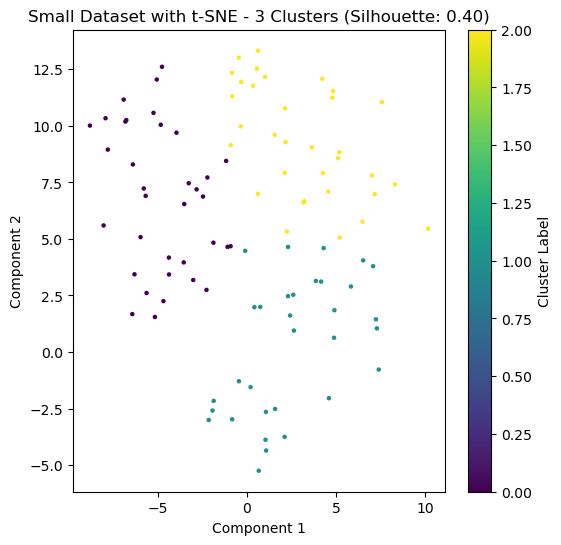

Applying K-means with 5 clusters on Small Dataset with t-SNE...
Silhouette Score for 5 clusters: 0.3762
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_20.jpg


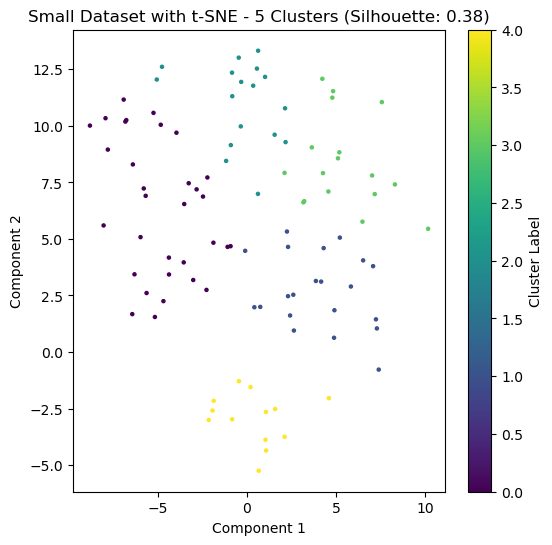

Applying K-means with 8 clusters on Small Dataset with t-SNE...
Silhouette Score for 8 clusters: 0.3919
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_21.jpg


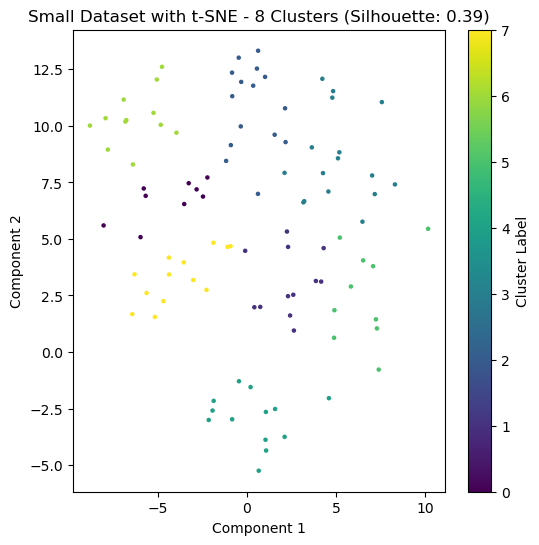

Applying K-means with 15 clusters on Small Dataset with t-SNE...
Silhouette Score for 15 clusters: 0.4072
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_22.jpg


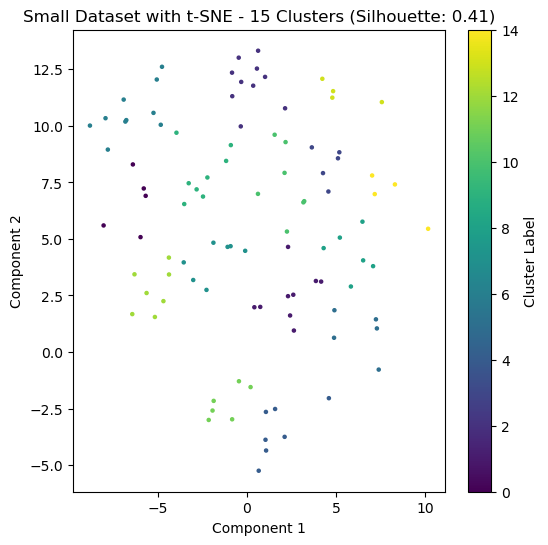

Applying K-means with 25 clusters on Small Dataset with t-SNE...
Silhouette Score for 25 clusters: 0.4045
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_23.jpg


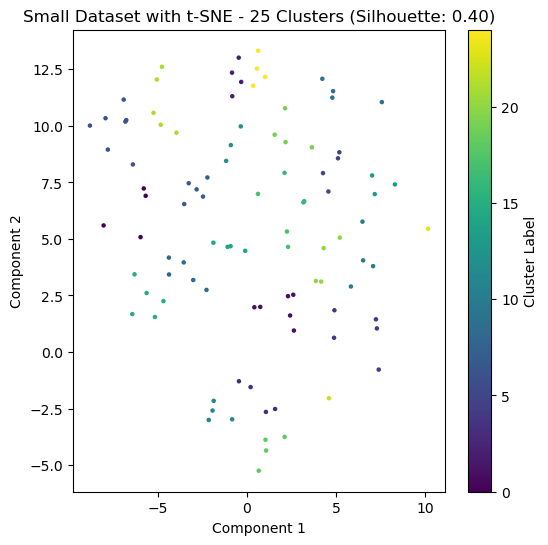

Applying K-means with 35 clusters on Small Dataset with t-SNE...
Silhouette Score for 35 clusters: 0.4380
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_24.jpg


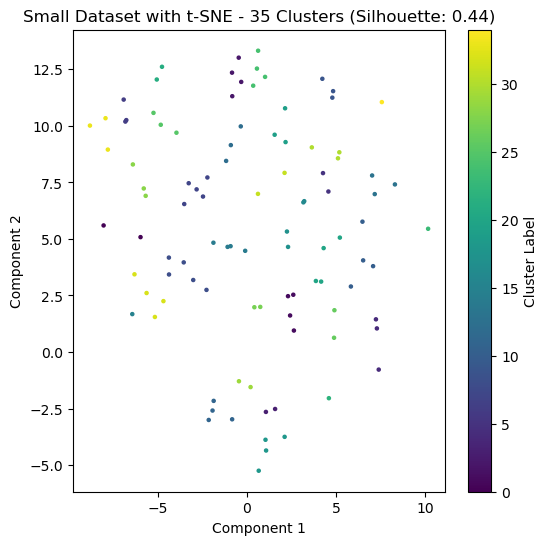

Applying K-means with 50 clusters on Small Dataset with t-SNE...
Silhouette Score for 50 clusters: 0.3808
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_25.jpg


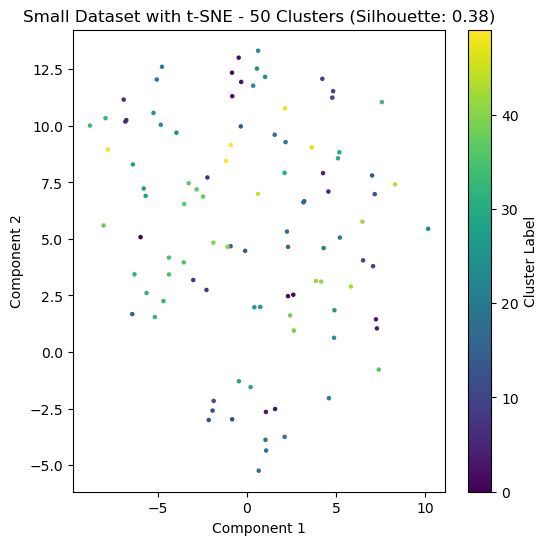

Applying K-means with 80 clusters on Small Dataset with t-SNE...
Silhouette Score for 80 clusters: 0.2352
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_26.jpg


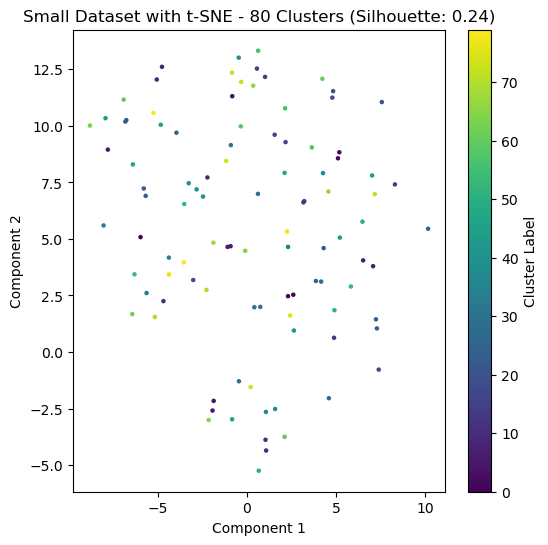

In [557]:
print("\nSmall Dataset Clustering:")
small_kmeans_results = apply_kmeans_tsne(small_tsne, n_clusters_list, "Small Dataset with t-SNE")


Medium Dataset Clustering:
Applying K-means with 3 clusters on Medium Dataset with t-SNE...
Silhouette Score for 3 clusters: 0.3544
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_27.jpg


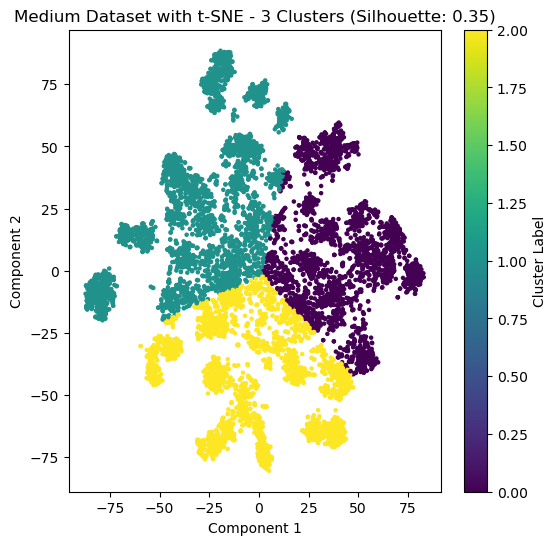

Applying K-means with 5 clusters on Medium Dataset with t-SNE...
Silhouette Score for 5 clusters: 0.3759
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_28.jpg


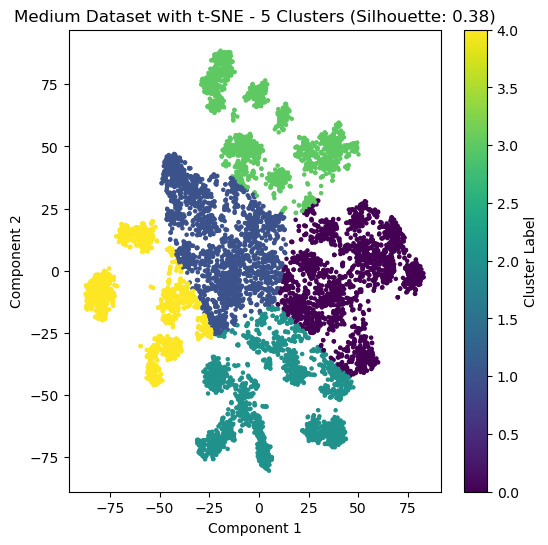

Applying K-means with 8 clusters on Medium Dataset with t-SNE...
Silhouette Score for 8 clusters: 0.4114
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_29.jpg


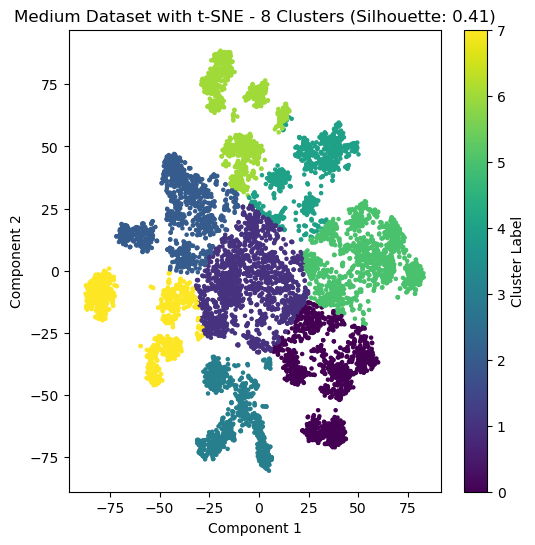

Applying K-means with 15 clusters on Medium Dataset with t-SNE...
Silhouette Score for 15 clusters: 0.4132
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_30.jpg


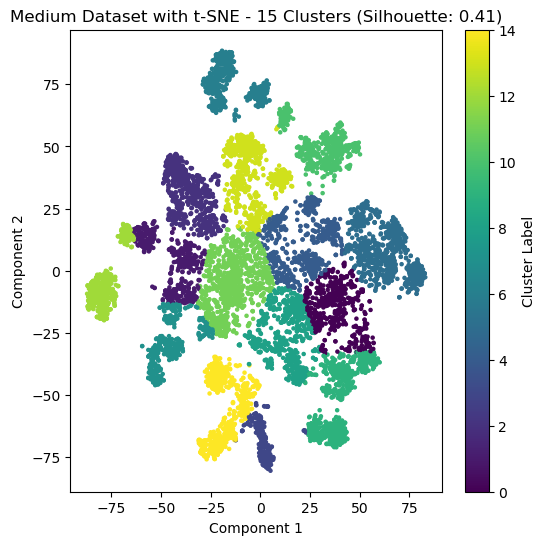

Applying K-means with 25 clusters on Medium Dataset with t-SNE...
Silhouette Score for 25 clusters: 0.4461
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_31.jpg


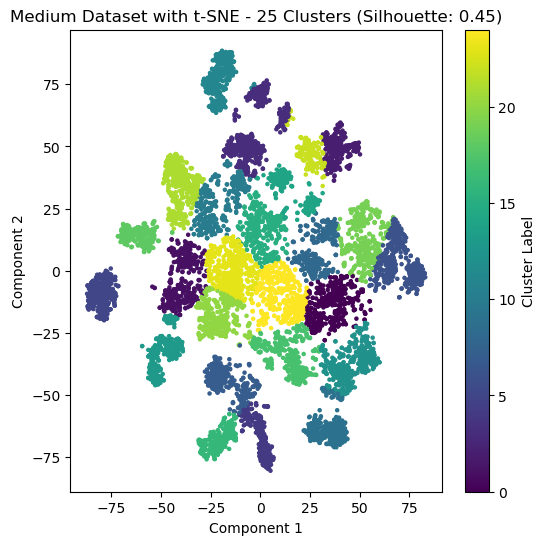

Applying K-means with 35 clusters on Medium Dataset with t-SNE...
Silhouette Score for 35 clusters: 0.4762
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_32.jpg


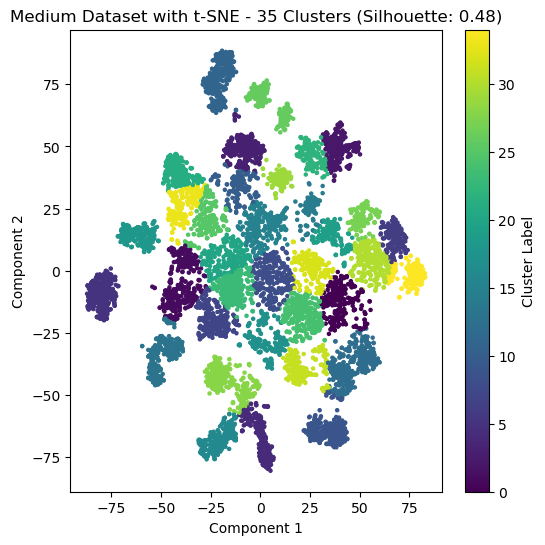

Applying K-means with 50 clusters on Medium Dataset with t-SNE...
Silhouette Score for 50 clusters: 0.4627
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_33.jpg


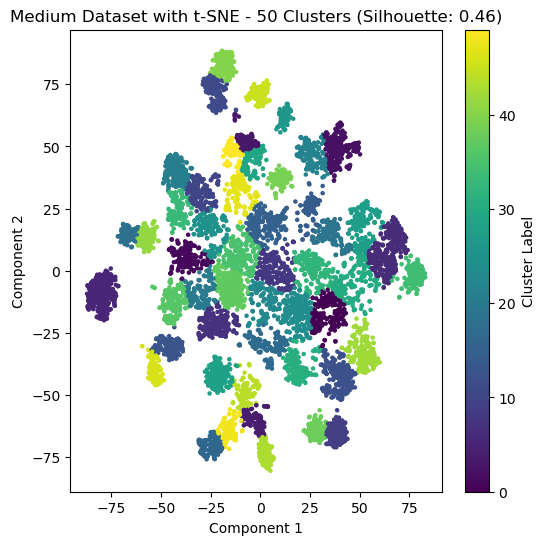

Applying K-means with 80 clusters on Medium Dataset with t-SNE...
Silhouette Score for 80 clusters: 0.4380
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_34.jpg


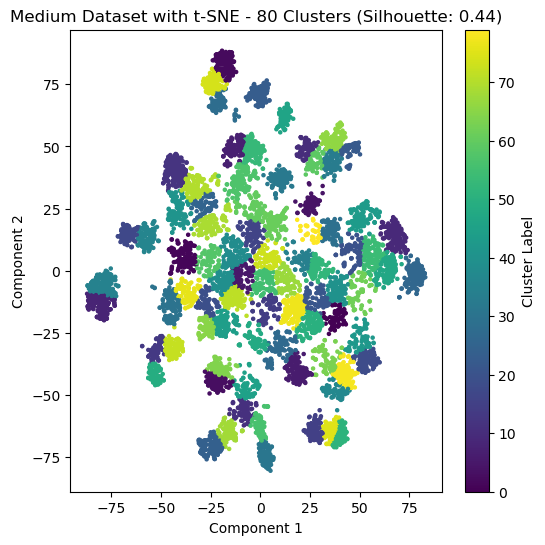

In [559]:
print("\nMedium Dataset Clustering:")
medium_kmeans_results = apply_kmeans_tsne(medium_tsne, n_clusters_list, "Medium Dataset with t-SNE")


Large Dataset Clustering:
Applying K-means with 3 clusters on Large Dataset with t-SNE...
Silhouette Score for 3 clusters: 0.3804
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_35.jpg


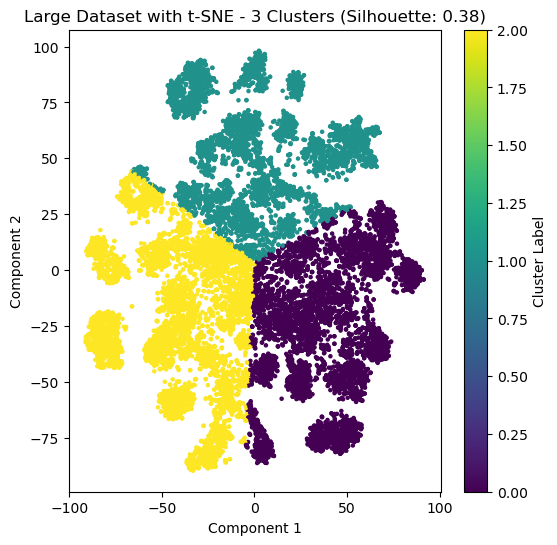

Applying K-means with 5 clusters on Large Dataset with t-SNE...
Silhouette Score for 5 clusters: 0.3684
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_36.jpg


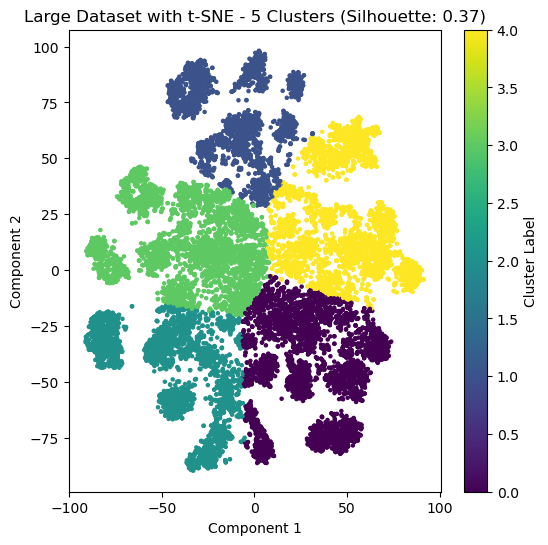

Applying K-means with 8 clusters on Large Dataset with t-SNE...
Silhouette Score for 8 clusters: 0.3848
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_37.jpg


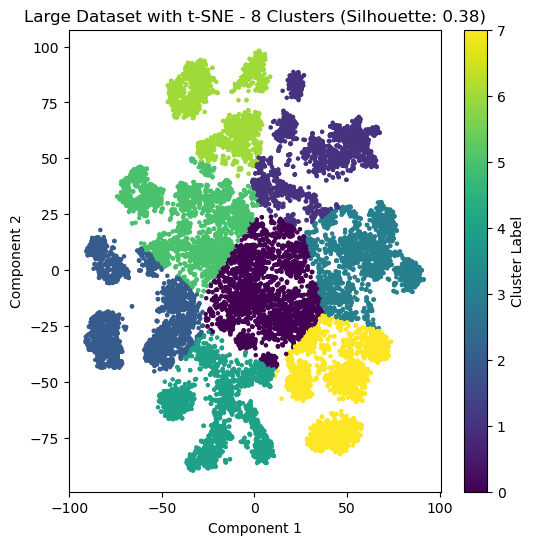

Applying K-means with 15 clusters on Large Dataset with t-SNE...
Silhouette Score for 15 clusters: 0.4099
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_38.jpg


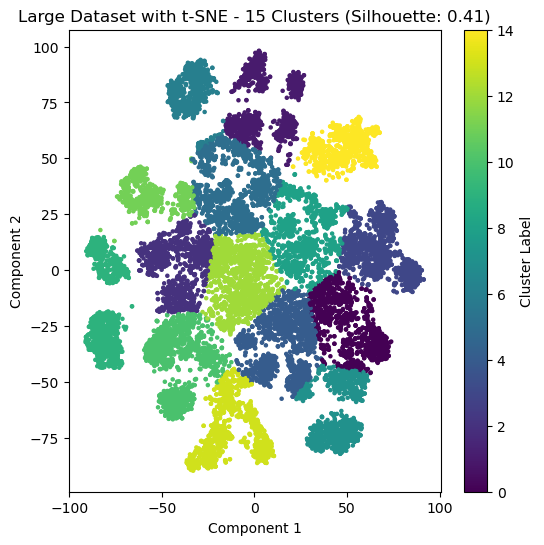

Applying K-means with 25 clusters on Large Dataset with t-SNE...
Silhouette Score for 25 clusters: 0.4553
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_39.jpg


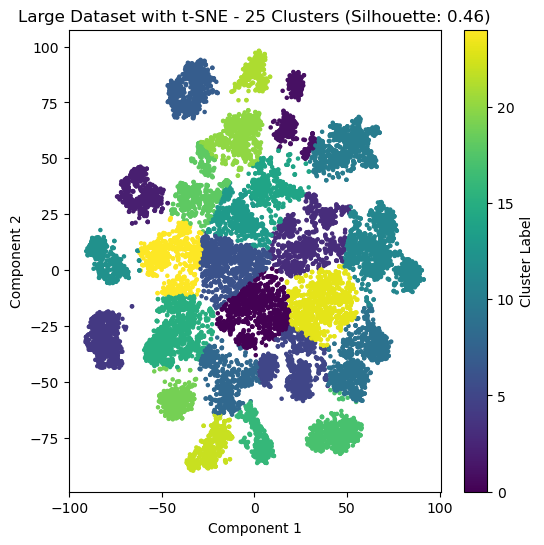

Applying K-means with 35 clusters on Large Dataset with t-SNE...
Silhouette Score for 35 clusters: 0.4579
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_40.jpg


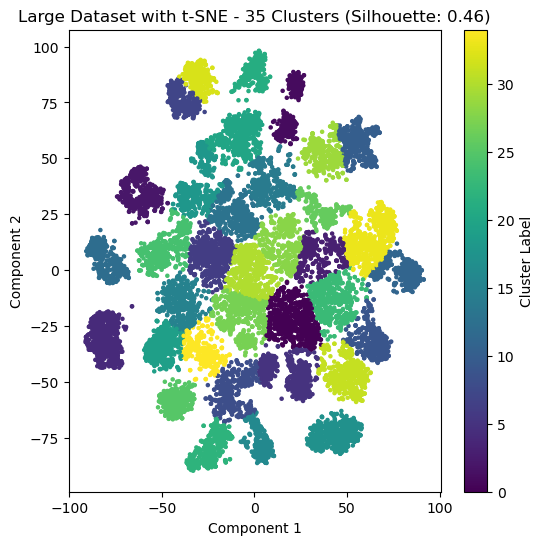

Applying K-means with 50 clusters on Large Dataset with t-SNE...
Silhouette Score for 50 clusters: 0.4494
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_41.jpg


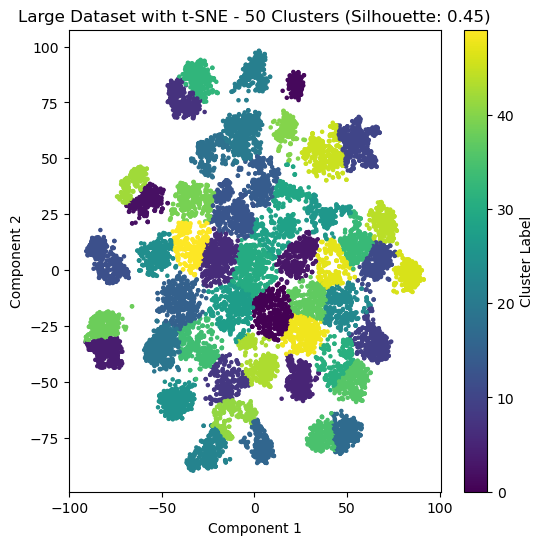

Applying K-means with 80 clusters on Large Dataset with t-SNE...
Silhouette Score for 80 clusters: 0.4269
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_42.jpg


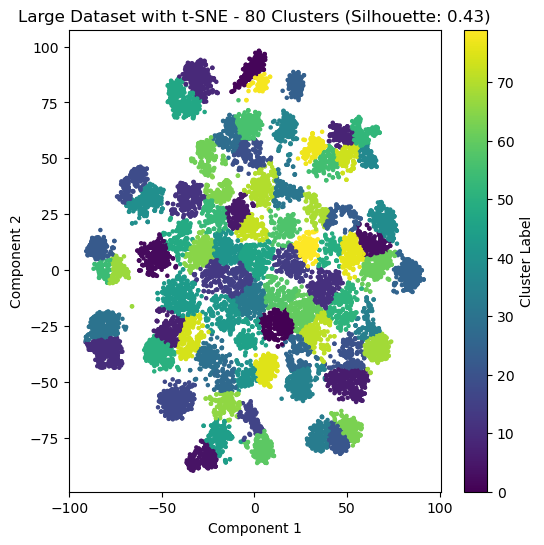

In [561]:
print("\nLarge Dataset Clustering:")
large_kmeans_results = apply_kmeans_tsne(large_tsne, n_clusters_list, "Large Dataset with t-SNE")

# 7. Evaluation

## Silhouette Scores and Inertia (Elbow Method) for the CLIP embeddings with PCA

In [563]:
def evaluate_kmeans(embeddings, cluster_range, dataset_name="Dataset"):
    """
    Evaluate K-Means clustering using Silhouette Score and Inertia.

    Args:
        embeddings: 2D array (e.g., PCA or UMAP embeddings).
        cluster_range: List of cluster numbers to evaluate.
        dataset_name: Name of the dataset (for plot titles).

    Returns:
        Silhouette scores and inertia values for the range of clusters.
    """
    silhouette_scores = []
    inertia_scores = []

    for n_clusters in cluster_range:
        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')
        cluster_labels = kmeans.fit_predict(embeddings)

        silhouette_avg = silhouette_score(embeddings, cluster_labels)
        silhouette_scores.append(silhouette_avg)

        inertia_scores.append(kmeans.inertia_)

        print(f"Silhouette Score for {n_clusters} clusters: {silhouette_avg:.4f}")

    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.plot(cluster_range, silhouette_scores, marker='o')
    plt.title(f"{dataset_name} - Silhouette Scores")
    save_current_figure_sequentially()
    plt.xlabel("Number of Clusters")
    plt.ylabel("Silhouette Score")
    plt.grid()

    plt.subplot(1, 2, 2)
    plt.plot(cluster_range, inertia_scores, marker='o')
    plt.title(f"{dataset_name} - Inertia (Elbow Method)")
    save_current_figure_sequentially()
    plt.xlabel("Number of Clusters")
    plt.ylabel("Inertia")
    plt.grid()

    plt.tight_layout()
    plt.show()

    return silhouette_scores, inertia_scores

cluster_range = [3, 5, 8, 15, 25, 35, 50, 80]


Evaluating Small Dataset:
Silhouette Score for 3 clusters: 0.0619
Silhouette Score for 5 clusters: 0.0572
Silhouette Score for 8 clusters: 0.0826
Silhouette Score for 15 clusters: 0.0901
Silhouette Score for 25 clusters: 0.1371
Silhouette Score for 35 clusters: 0.1528
Silhouette Score for 50 clusters: 0.1281
Silhouette Score for 80 clusters: 0.0726
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_43.jpg
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_44.jpg


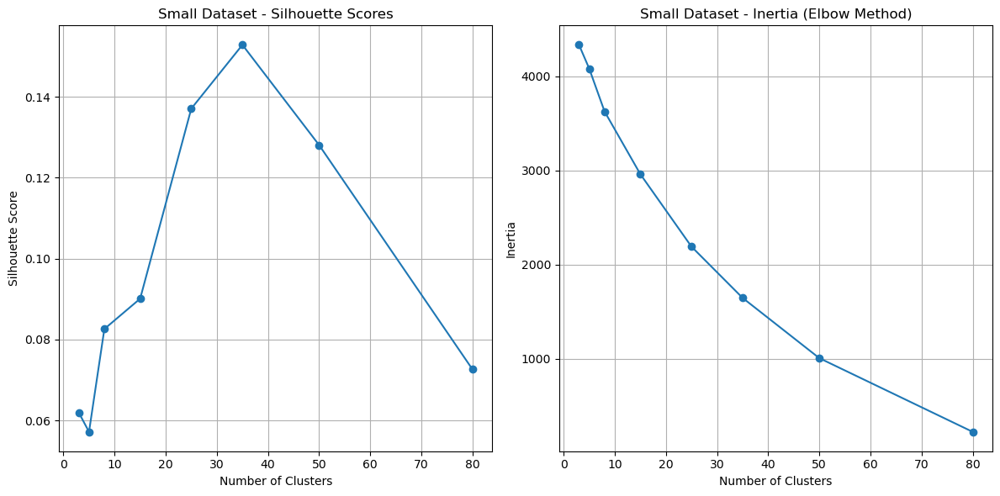

In [565]:
print("\nEvaluating Small Dataset:")
small_silhouette, small_inertia = evaluate_kmeans(small_embeddings_pca, cluster_range, dataset_name="Small Dataset")


Evaluating Medium Dataset:
Silhouette Score for 3 clusters: 0.0799
Silhouette Score for 5 clusters: 0.1040
Silhouette Score for 8 clusters: 0.1232
Silhouette Score for 15 clusters: 0.1256
Silhouette Score for 25 clusters: 0.1309
Silhouette Score for 35 clusters: 0.1231
Silhouette Score for 50 clusters: 0.1192
Silhouette Score for 80 clusters: 0.1014
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_45.jpg
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_46.jpg


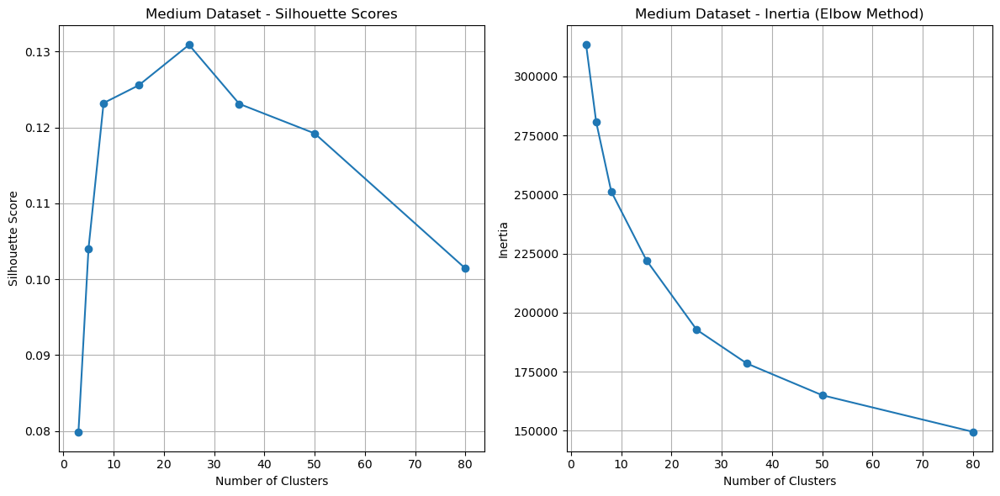

In [567]:
print("\nEvaluating Medium Dataset:")
medium_silhouette, medium_inertia = evaluate_kmeans(medium_embeddings_pca, cluster_range, dataset_name="Medium Dataset")


Evaluating Large Dataset:
Silhouette Score for 3 clusters: 0.0891
Silhouette Score for 5 clusters: 0.1071
Silhouette Score for 8 clusters: 0.1250
Silhouette Score for 15 clusters: 0.1286
Silhouette Score for 25 clusters: 0.1302
Silhouette Score for 35 clusters: 0.1267
Silhouette Score for 50 clusters: 0.1128
Silhouette Score for 80 clusters: 0.1044
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_47.jpg
Figure saved as: /Users/henrikformoe/Desktop/visualization_COGS199/fig_48.jpg


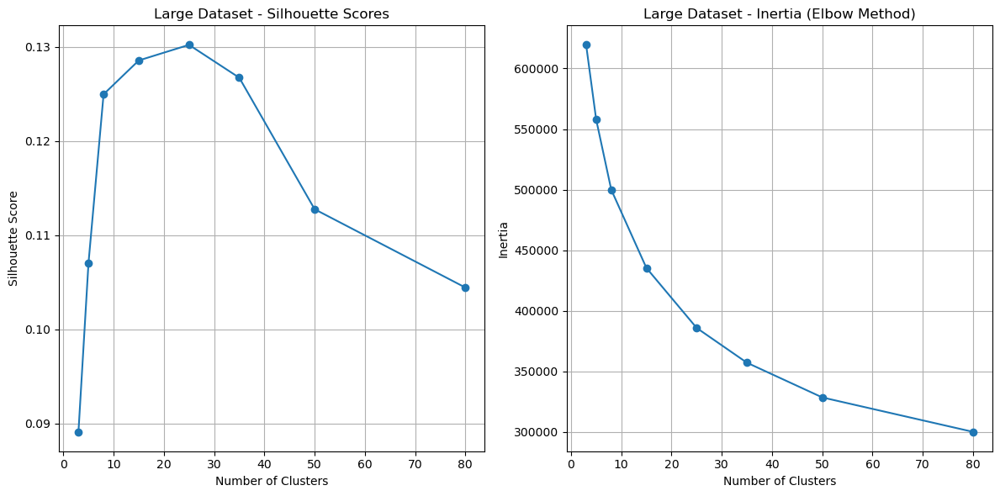

In [569]:
print("\nEvaluating Large Dataset:")
large_silhouette, large_inertia = evaluate_kmeans(large_embeddings_pca, cluster_range, dataset_name="Large Dataset")